In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import math

### Pulling data file

In [2]:
data_file=pd.read_csv(r'C:\Users\guptaek\fliprobo_files\Project-Housing_splitted\train.csv')

## EDA

In [3]:
## shape of data
data_file.shape

(1168, 81)

#### viewing variable and their data types

In [4]:
## viewing variable and their data types
data_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [5]:
data_file.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [6]:
## displaying all columns with null values and their respective null values count
df_nan=pd.DataFrame(data_file[data_file.columns[data_file.isnull().any()]].isnull().sum())
df_nan.columns=['null_values']
df_nan['% of null values']=df_nan['null_values']/11.68
df_nan

,null_values,% of null values
LotFrontage,214,18.321918
Alley,1091,93.407534
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658


* Some variable contains more than 80% null values

In [7]:
## dropping values with >80 % null values
Data_file=data_file.drop(['MiscFeature','Fence','PoolQC','Alley'],axis=1)

In [8]:
## framing a dataframe which shows correlation value between respective columns
df_corr=Data_file.corr()

<AxesSubplot:>

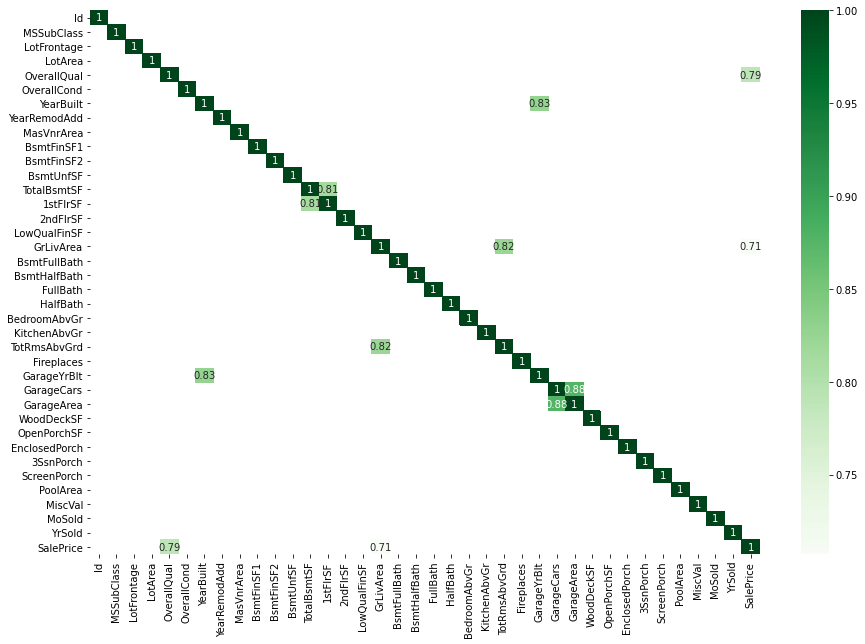

In [9]:
## checking variables which have correlation coefficient more than 0.7 to check multicollinearilty issue
plt.figure(figsize=(15,10))
sb.heatmap(df_corr[df_corr>0.7],annot=True,cmap='Greens')

* Some attributes are found having multicollinearity issue

In [10]:
## removing columns having multicollinearity , so that multicollinearity could not affect predictions
Data_file.drop(['GarageCars','1stFlrSF','GarageYrBlt','TotRmsAbvGrd'],axis=1,inplace=True)

<AxesSubplot:>

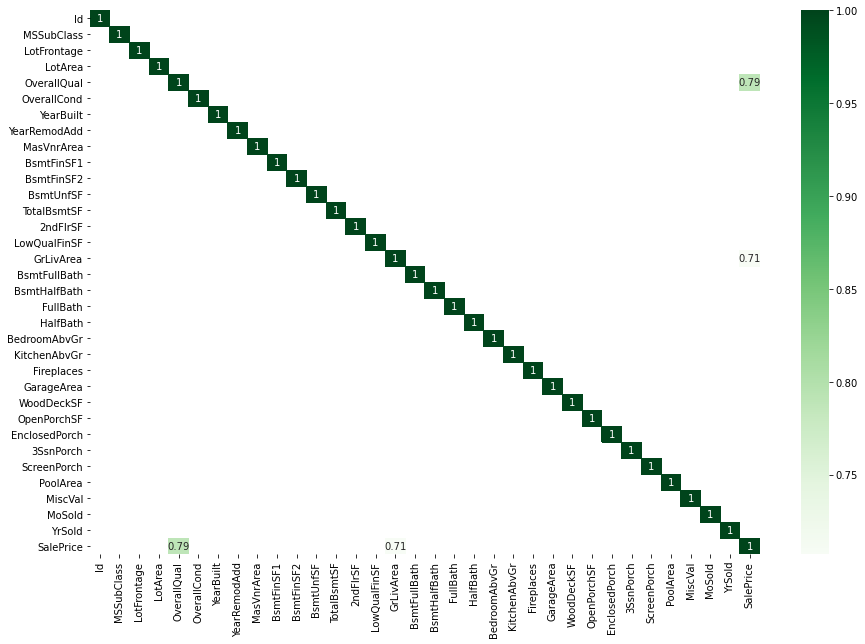

In [11]:
## Again checking for confirmation
df_corr=Data_file.corr()
plt.figure(figsize=(15,10))
sb.heatmap(df_corr[df_corr>0.7],annot=True,cmap='Greens')

* Multicollinearity removed from dataset (the remaing two columns are left because they are directly related to target variable)

<AxesSubplot:>

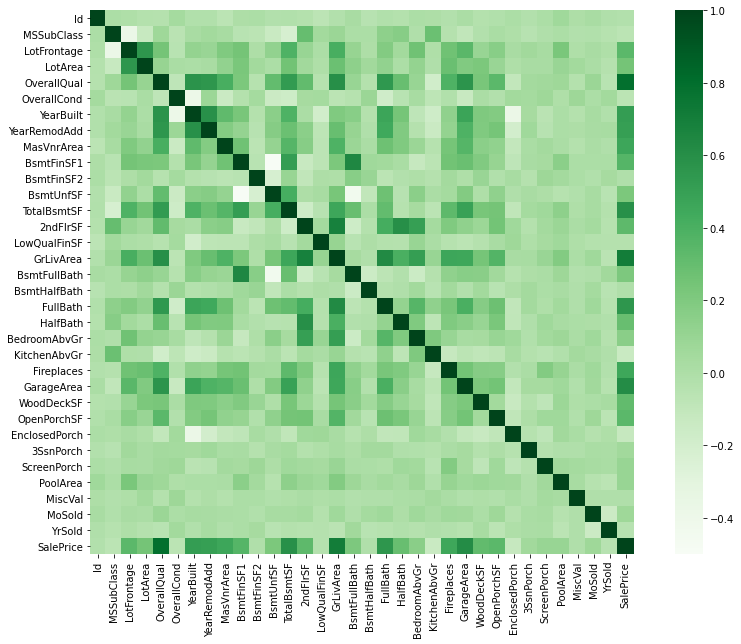

In [12]:
plt.figure(figsize=(15,10))
sb.heatmap(Data_file.corr(),cmap='Greens',square=True)

#### Memory optimization

In [13]:
####################### since highest and lowest values within each feature is 32 bit range hence changing the datatypes of features from 64 bit to 32 bit for efficient memory use ###################3
for i in Data_file.columns:
    if(Data_file.dtypes[i]=='int64'): Data_file[i]=Data_file[i].astype('int32')
    if(Data_file.dtypes[i]=='float64'): Data_file[i]=Data_file[i].astype('float32')

In [14]:
Data_file.iloc[:,:45].describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea
count,1168.000000,1168.000000,954.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.988472,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310074,444.726027,46.647260,569.721747,1061.095034,348.826199,6.380137,1525.066781
std,416.159877,41.940650,24.828749,8957.442311,1.390153,1.124343,30.145255,20.785185,182.596054,462.664785,163.520016,449.375525,442.272249,439.696370,50.892844,528.042957
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000
25%,360.500000,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,0.000000,0.000000,1143.250000
50%,714.500000,50.000000,70.000000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,0.000000,0.000000,1468.500000
75%,1079.500000,70.000000,80.000000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,729.000000,0.000000,1795.000000
max,1460.000000,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,2065.000000,572.000000,5642.000000


In [15]:
Data_file.iloc[:,45:].describe()

,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,0.617295,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,0.650575,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,0.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,1.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,1.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,3.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


* columns MasVnrArea,BsmtFinSF1,BsmtFinSF2,2ndFlrSF,LowQualFinSF,BsmtFullBath,HalfBath,Fireplaces,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal have outliers
* Some features have more than 50% of ‘0’ values like ‘MasVnrArea’,’ BsmtFinSF2’, ‘2ndFlrSF’, ‘LowQualFinSF’, ‘BsmtFullBath’ ,’ BsmtHalfBath’, ‘HalfBath’, ‘WoodDeckSF’, ‘EnclosedPorch’, ‘3SsnPorch’, ‘ScreenPorch’,’ PoolArea’, ‘MiscVal’

#### Data Visualization

##### Univariate analysis

<AxesSubplot:ylabel='Density'>

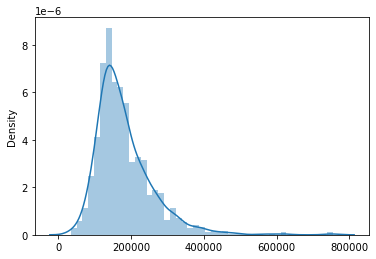

In [16]:
#################################### checking distribution of target variable ##################################################
sb.distplot(x=Data_file['SalePrice'])

* Distribution is right skewed

In [17]:
## storing all string columns and numerical columns separately for better analysis
str_cols=[i for i in Data_file.columns if(Data_file.dtypes[i]=='object')]
numerical_cols=[i for i in Data_file.columns if(Data_file.dtypes[i]!='object')]
print(len(str_cols),' String variables and ',len(numerical_cols),' numerical variables') 

39  String variables and  34  numerical variables


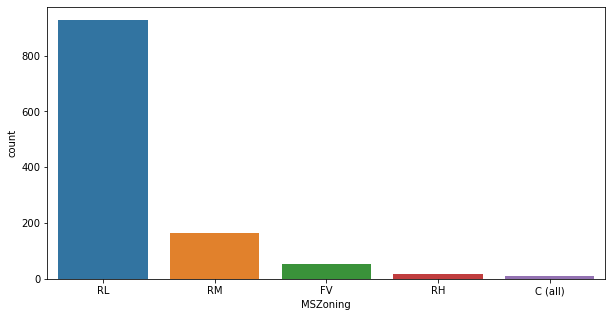

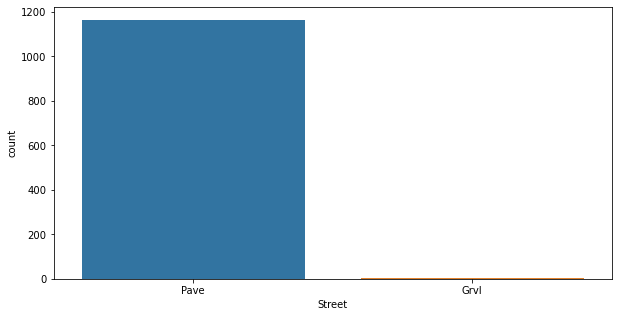

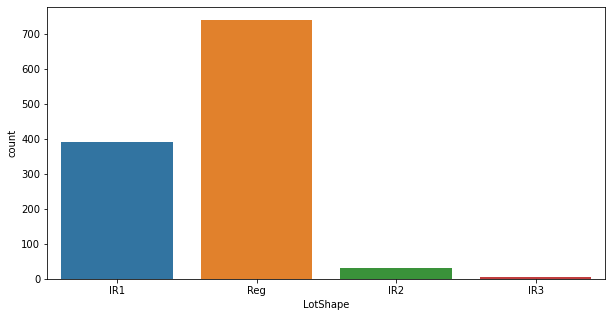

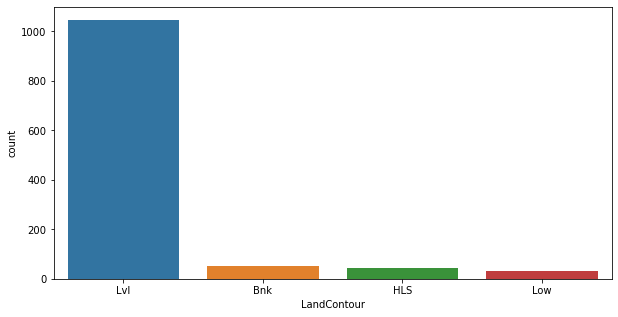

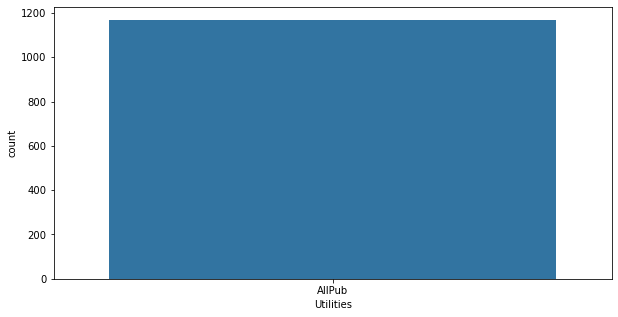

...

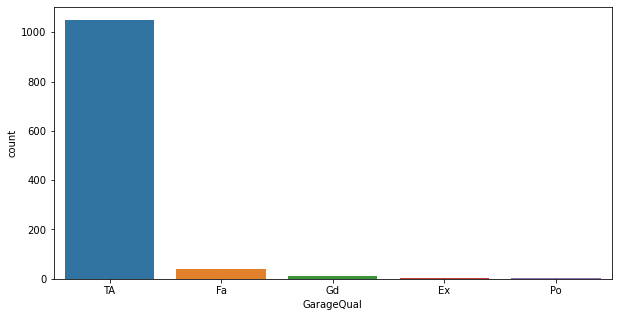

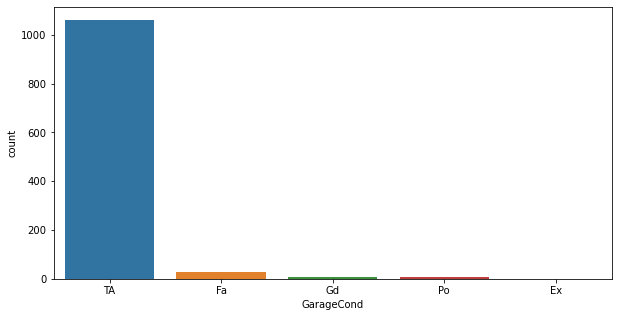

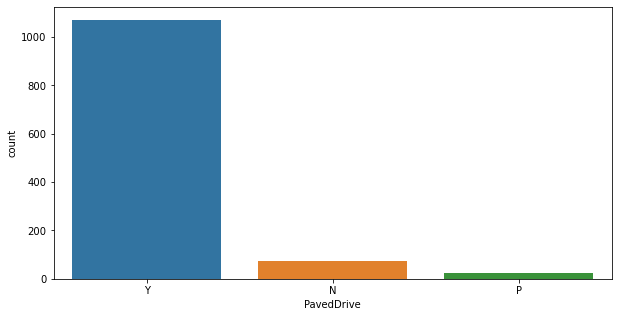

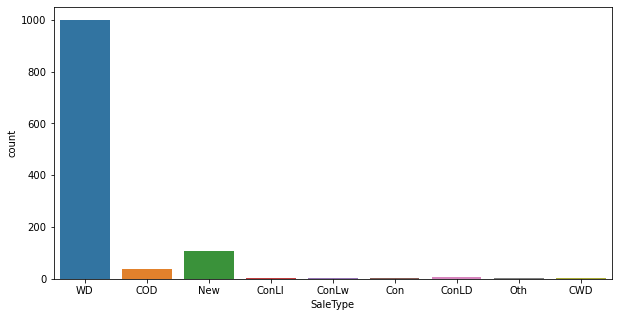

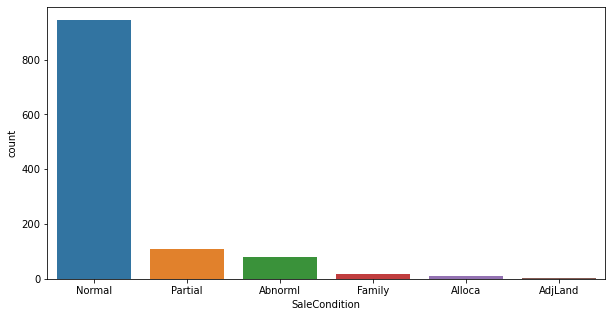

In [18]:

for i in str_cols:
    plt.subplots(figsize=(10,5))
    sb.countplot(x=Data_file[i])


In [19]:
## printing percentage of data classification in each string attribute
for i in str_cols:print(Data_file.groupby(i).count()['MSSubClass']/1168,'\n')

MSZoning
C (all)    0.007705
FV         0.044521
RH         0.013699
RL         0.794521
RM         0.139555
Name: MSSubClass, dtype: float64 

Street
Grvl    0.003425
Pave    0.996575
Name: MSSubClass, dtype: float64 

LotShape
IR1    0.333904
IR2    0.027397
IR3    0.005137
Reg    0.633562
Name: MSSubClass, dtype: float64 

LandContour
Bnk    0.042808
HLS    0.035959
Low    0.025685
Lvl    0.895548
Name: MSSubClass, dtype: float64 

Utilities
AllPub    1.0
Name: MSSubClass, dtype: float64 

LotConfig
Corner     0.190068
CulDSac    0.059075
FR2        0.028253
FR3        0.001712
Inside     0.720890
Name: MSSubClass, dtype: float64 

LandSlope
Gtl    0.946062
Mod    0.043664
Sev    0.010274
Name: MSSubClass, dtype: float64 

Neighborhood
Blmngtn    0.012842
Blueste    0.001712
BrDale     0.009418
BrkSide    0.042808
ClearCr    0.020548
CollgCr    0.101027
Crawfor    0.038527
Edwards    0.071062
Gilbert    0.054795
IDOTRR     0.025685
MeadowV    0.007705
Mitchel    0.029110
NAmes      

* In MSZoning 80 % of houses were purchased in Low density resedential Areas
* 99.5 % of purchased houses had access to paved roads so we can consider almost no houses were purchased which had gravel road access
* 635 purchased houses were of Regular shape followed by slightly irregular type (33%).It means people in Austalia gives priority to regular shaped houses
* In Land Contours ,90% of purchased houses were neary flat level
* All houses had all public utlilies facility.
* In Lot configuration, 72% of purchased houses had Inside lot of the property
* 94% of purchased houses had gentle slope
* In neighbourhood,highest 15% of purhcased houses has neighbourhood of Nort Ames followed by college creek(10%) and least houses were purchased in neighbour hood of Bluestem
* 86% of purchased houses had normal proximity to various conditions1 and least 0.005% had RRne proximity
* 90% of purchased houses had normal proximity to various conditions2
* 83% purchased houses were single family dwelling
* 50% houses had 1story dwelling style followed by 2story style (30%)
* 78% of houses have Gable roof style and 20% have Hip roof style
* 98% houses have roof material - Standard (Composite) Shingle
* 33% houses have Vinylsiding covering on exteriors 15% have hard board and metal siding
* 60% of houses have no masonry veneer type followed by Brick face (30%)
* 61% houses have Average quality of material on the exterior
* 87% houses are currently in average condition of exterior material
* Max 44% houses have foundation tyoe cinder block followed by poured concrete
* 44% of houses have typical (80-89 inches) basement height(BsmtQual) followed by good (90-99 inches)
* 90% of houses have typical(TA) basment condition in which slight dampness allowed
* 64% of houses have No exposure 
* Max houses (30%) have unfinished basement area and 28% comes under GLQ(good living quarters)
* 97% houses have GasA(Gas forced warm air furnace) heating type
* 30% houses have average quality heating
* 93% houses are central air
* 91% houses have SbrKr(Standard Circuit Breakers & Romex) type of electrical systems
* 50% houses have average (TA) kitchen quality
* 92% houses have typical (TA) home functionality
* 25% houses have Gd(Good - Masonry Fireplace in main level) FireplaceQuality
* 60% houses have Attached garage type
* 41% of houses have unfinished garage
* 90% of houses have average garage quality
* 90% of houses are in average garage condition
* 90% of houses have paved drive way
* 85% houses have sale type WD(warranty deed -conventional)
* 80% of houses are in normal sale condition

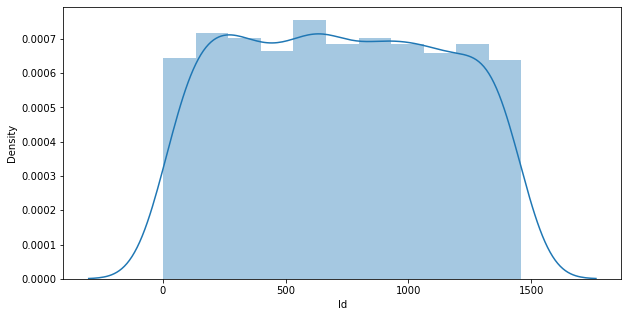

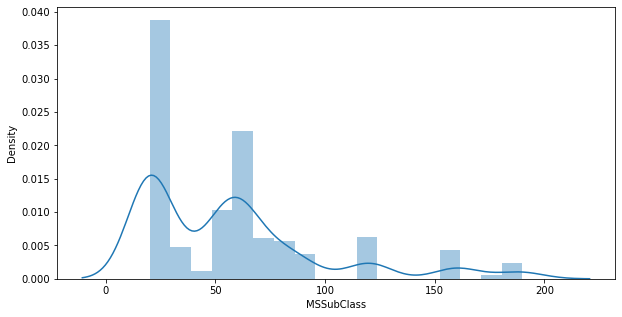

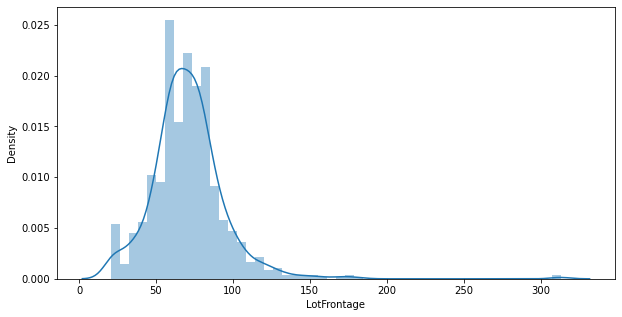

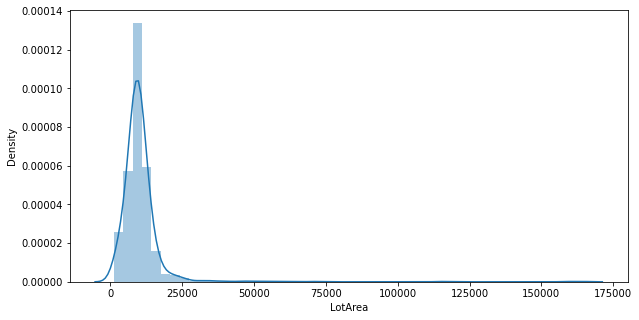

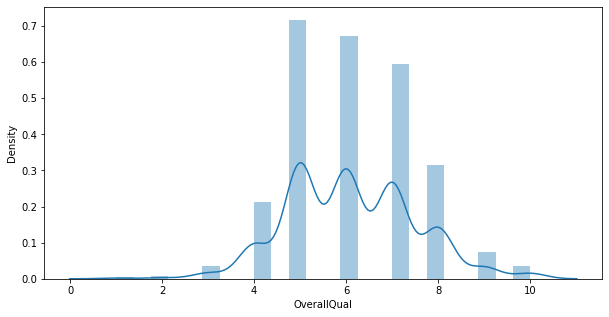

...

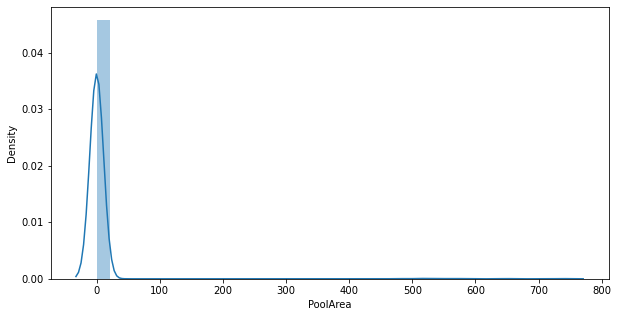

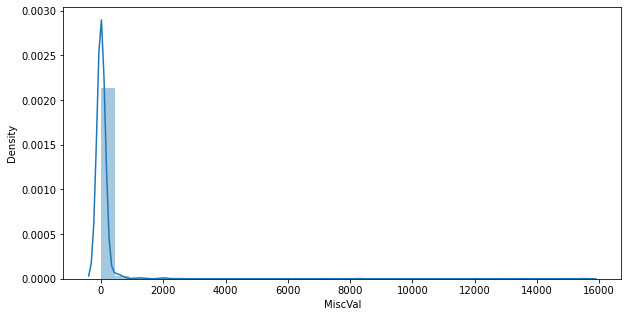

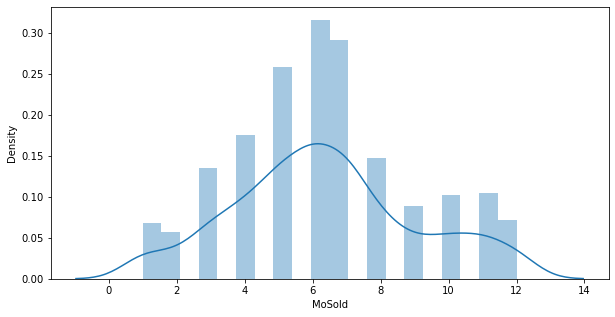

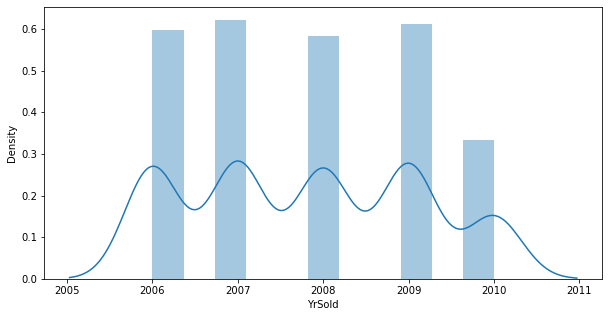

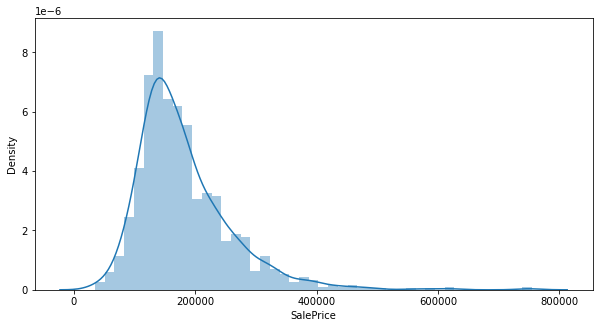

In [20]:
for i in numerical_cols:
    plt.subplots(figsize=(10,5))
    sb.distplot(Data_file[i])

* LotFrontage,LotArea is almost normally distributed
* LotArea,MiscVal,PoolArea,3SsnPorch,KitchenAbvGris leptokurtic
* Yearbulit is left skewed
* MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,saleprice is right skewed
* GrLiveArea is platykurtic

In [21]:
#$$$$$ Viewing description for numerical features only to get insights
Data_file.loc[:,numerical_cols[:17]].describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath
count,1168.000000,1168.000000,954.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.988472,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310074,444.726027,46.647260,569.721747,1061.095034,348.826199,6.380137,1525.066781,0.425514
std,416.159877,41.940650,24.828749,8957.442311,1.390153,1.124343,30.145255,20.785185,182.596054,462.664785,163.520016,449.375525,442.272249,439.696370,50.892844,528.042957,0.521615
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000
25%,360.500000,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,0.000000,0.000000,1143.250000,0.000000
50%,714.500000,50.000000,70.000000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,0.000000,0.000000,1468.500000,0.000000
75%,1079.500000,70.000000,80.000000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,729.000000,0.000000,1795.000000,1.000000
max,1460.000000,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,2065.000000,572.000000,5642.000000,3.000000


In [22]:
Data_file.loc[:,numerical_cols[17:]].describe()

,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,0.055651,1.562500,0.388699,2.884418,1.045377,0.617295,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,0.236699,0.551882,0.504929,0.817229,0.216292,0.650575,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,0.000000,1.000000,0.000000,2.000000,1.000000,0.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,0.000000,2.000000,0.000000,3.000000,1.000000,1.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,0.000000,2.000000,1.000000,3.000000,1.000000,1.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,2.000000,3.000000,2.000000,8.000000,3.000000,3.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


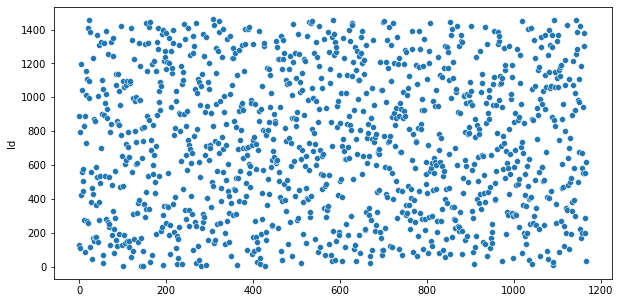

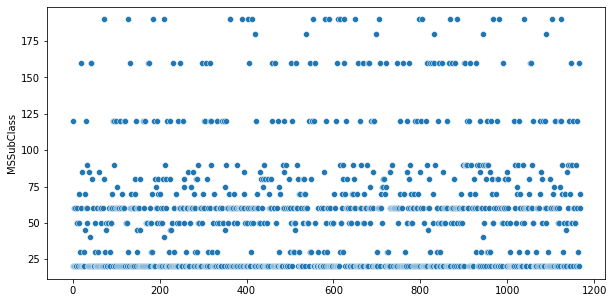

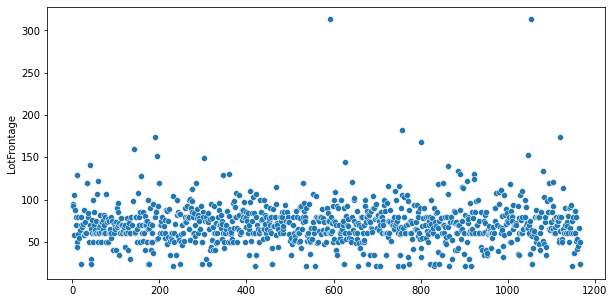

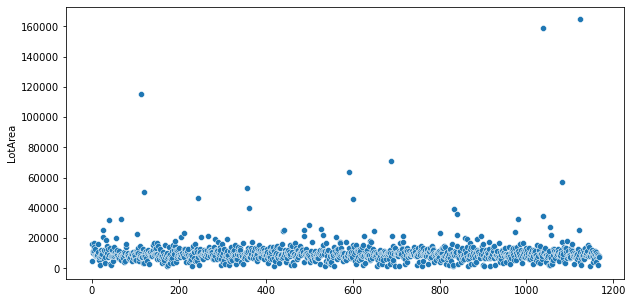

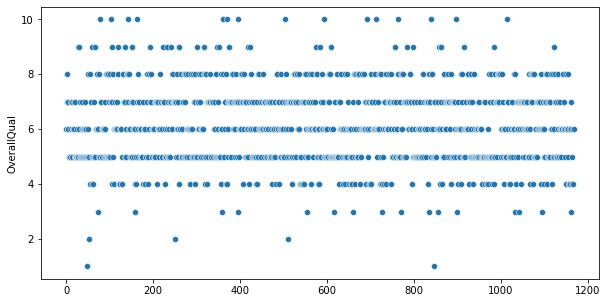

...

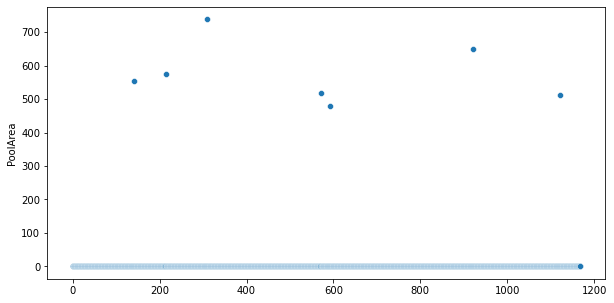

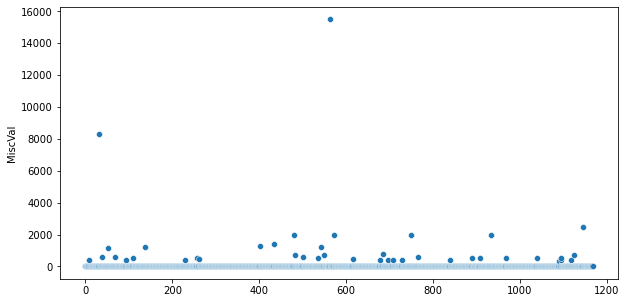

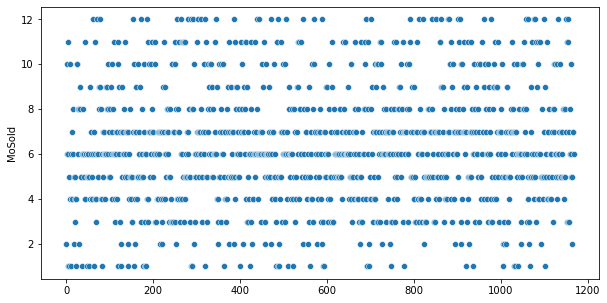

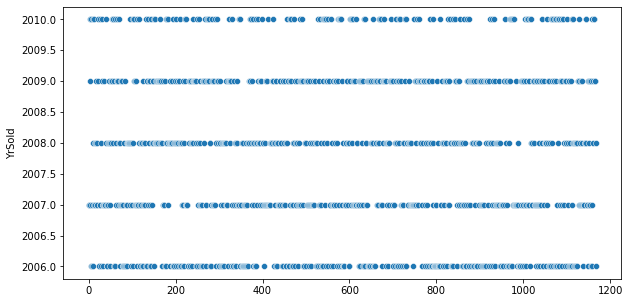

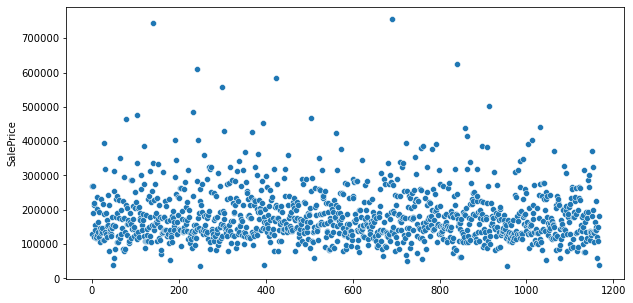

In [23]:
for i in numerical_cols:
    plt.subplots(figsize=(10,5))
    sb.scatterplot(y=Data_file[i],x=Data_file.index)

* Almost all houses have LotFrontage between 20 to 150
* Most of the houses have Lot size in between 1300 to 20000
* 50% of houses have Masonry veneer area as '0' and out of rest 50% houses most houses have Masonry veneer area in between 0 and 1000
* MOst houses have Type 1 finished square feet area of basement between 0 and 1500
* 75% of houses have Type 2 finished square feet area of 0
* Most houses have total sqaure feet of basement area (TotalBsmtSF) between 500 and 2500
* 50 % of houses have second floor square feet area as 0 and remaining have area in between 250 to 1500 sq ft
* 90% of houses do not have low quality finished quare feet area
* Most houses have above ground living sq ft area in between 800 to 3000
* 50% houses have no full bathrooms in basement and in remaining houses most have 1 full bathrooms in basement and very few has 2 full bathrooms
* 90% of houses have no half bathrooms in basement and very few has 1 half bathrooms in basement
* 25% houses have 1 full bathrooms above ground and 50% have 2 full bathrooms located above ground and very less have 3
* Most houses have 3 bedrooms above ground followed by 2 and 4
* Most houses have 1 Kitchen above ground followed by 2
* Most houses have 0 fireplaces followed by 1
* Most houses have Garage area in between 200 to 1000
* More than 50% of houses have 0 Wood Deck sq ft area and rest have in between 0 to 400
* 25% of houses have 0 open porch sq ft area and rest have in between 0 to 300
* Almost all houses have 0 enclosed porch sq ft area
* Almost all houses have 0 three season porch area sq ft
* Almost all houses have 0 screen porch area sq ft
* Almost all houses have 0 sq ft of pool area
* Almost all houses have 0  value of misc features
* Most houses have sale price in between 100000 to 400000

##### Bivariate analysis

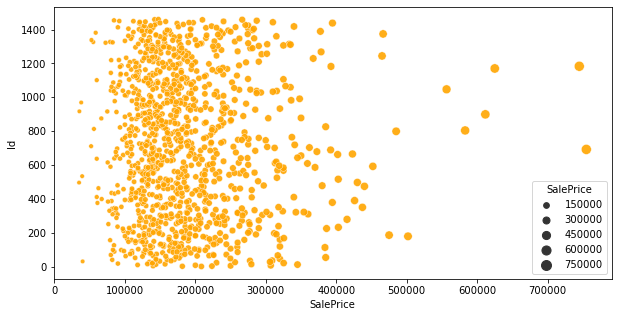

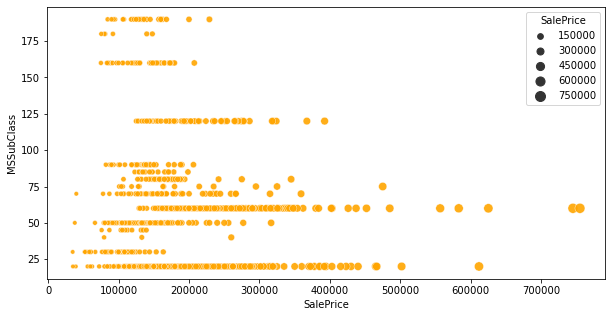

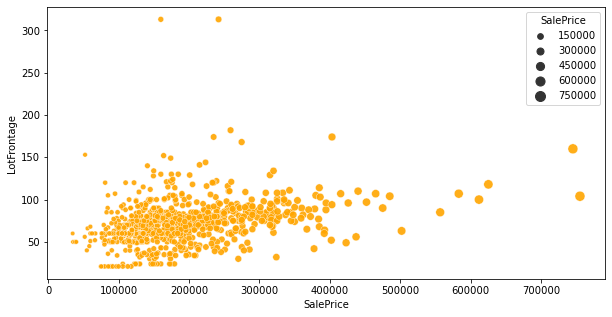

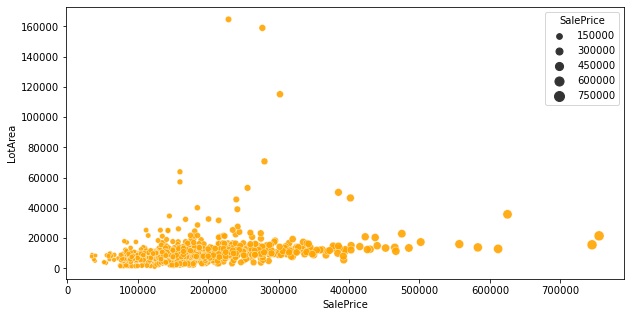

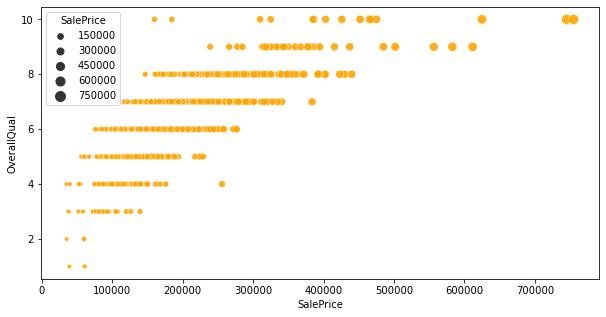

...

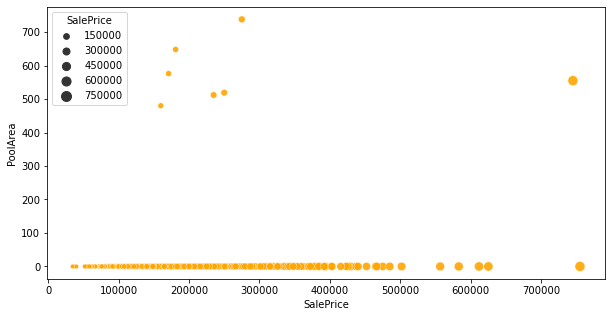

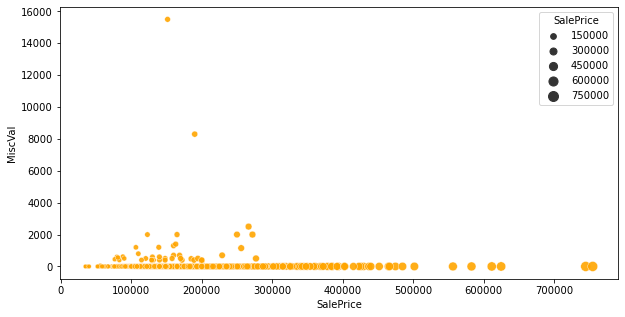

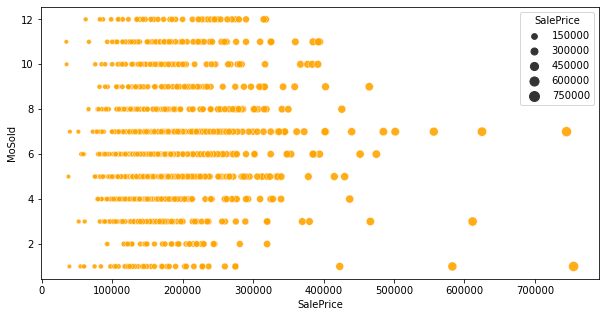

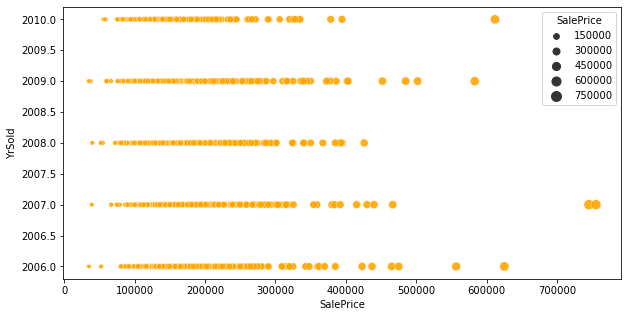

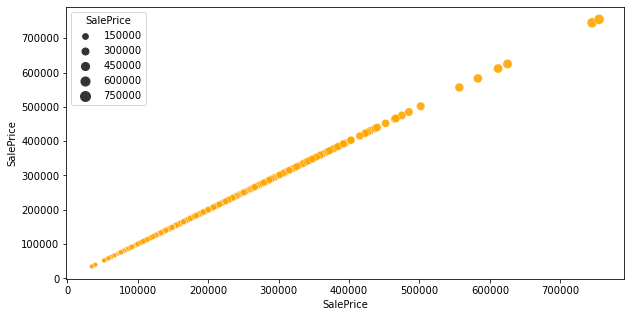

In [24]:
## visualizing each attribute against target attribute
for i in numerical_cols:
    plt.subplots(figsize=(10,5))
    sb.scatterplot(y=i,x='SalePrice',size='SalePrice',data=Data_file,color='orange',sizes=(20,100),legend='brief',alpha=0.9)


* sale price decreased with increase in type of dewlling
* Lot frontage doed not impact much on sale price since houses with different sale price are having same Lot frontage area
* similarly sale price doen not have much variation along with LotArea of the houses as can be seen different sale price are availble within the Lot area range of 0 to 20000.In fact some houses where Lot Area is very large have moderate sale price
* Overall quality is directly proportional to the sale price of houses
* Houses with  overall condition rating of 3,4,5,6 have differnt sale prices.Some  houses with average overall condition have very high sale price
* Houses sale price found increasing with the increase in the year built. Means houses which are build latest have high sale price in comparison to those build in early years
* similar is the case with remodelling date
* All most all types of sale prices are present in Masonry veneer area of 0 to 500
* Houses with higher  type 1 basement finished sq ft area have higher sale prices
* Unfinished sq ft of basement area does not have much impact on sale price
* Total sq ft of basement area is directly proportional to sale price
* sale price increases with increase in second floor sq ft area for houses where 2nd floor sq ft area is not 0
* Low qaulity finished sq ft area do not have much impact on sale price
* Above ground living area (GrLivArea) is positively correlated with sale price
* houses with 0 or 1 basement full bathrooms have high sale price compared to the ones having 2 full bathrooms on basement
* Houses with no half bathroom in basement were sold most followed by those having 1
* Houses with higher number of full bathrooms seems having high sale price
* Sale price of some of the houses having 4 bedrooms above ground is highes. Houses with 3,4 and 5 bedrooms above groud were sold in large quantity
* houses with 1 kitchen above ground have high sale price in comparison to those having 2 kitchens
* Houses with 1 and 2 fireplaces have higher prices in comparion to houses having 0 or 3 fireplaces
* Most Houses have garage area of 200 to 900 sq ft and have sale price in between 100000 to 400000. Garage area has weak positive correlation with sale price
* Wood deck sf do not have much impact on sale price of houses
* Open porch area sq ft do not have much impact on sale price since there are houses having high open porch area sq ft and less sale price and vice versa. and for some houses open porch area is less as well as sale price is also less
* Enclosed porch,Three season porch, screen porch,pool area,Miscval do not have impact on sale price
* time of house being sold does not impact sale price

##### Multivariate Analysis

<AxesSubplot:xlabel='SalePrice', ylabel='LotArea'>

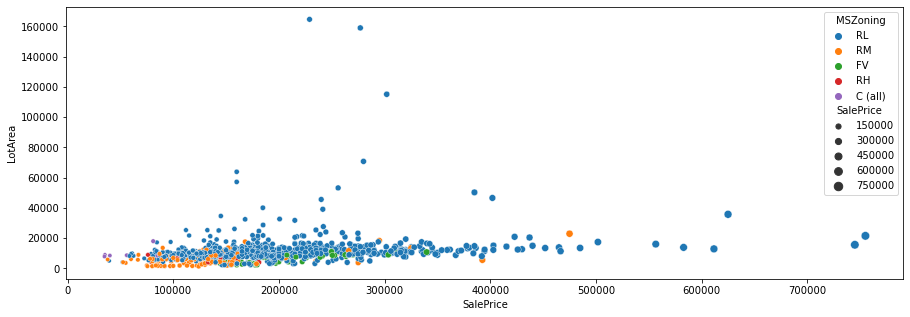

In [44]:
plt.subplots(figsize=(15,5))
sb.scatterplot(x='SalePrice',y='LotArea',hue='MSZoning',size='SalePrice',data=Data_file)


* Houses having Low Lot area and located in Resedential medium density areas were sold for less prices in comparison to those located at Resedential Low density areas
* It is clear that resedential density affects the price of the houses irrespectrive of Lotsize

<AxesSubplot:xlabel='SalePrice', ylabel='GrLivArea'>

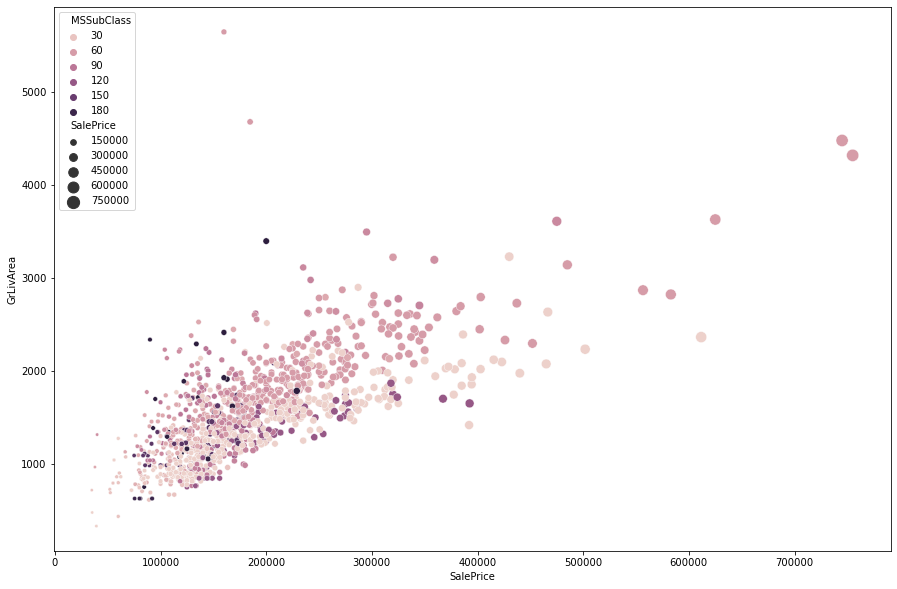

In [26]:
plt.figure(figsize=(15,10))
sb.scatterplot(x='SalePrice',y='GrLivArea',hue='MSSubClass',size='SalePrice',sizes=(10,150),data=Data_file)


* 2 story 1946 & newer houses were sold at better prices even with almost same GrLivarea with other dwelling types

<AxesSubplot:xlabel='SalePrice', ylabel='LotFrontage'>

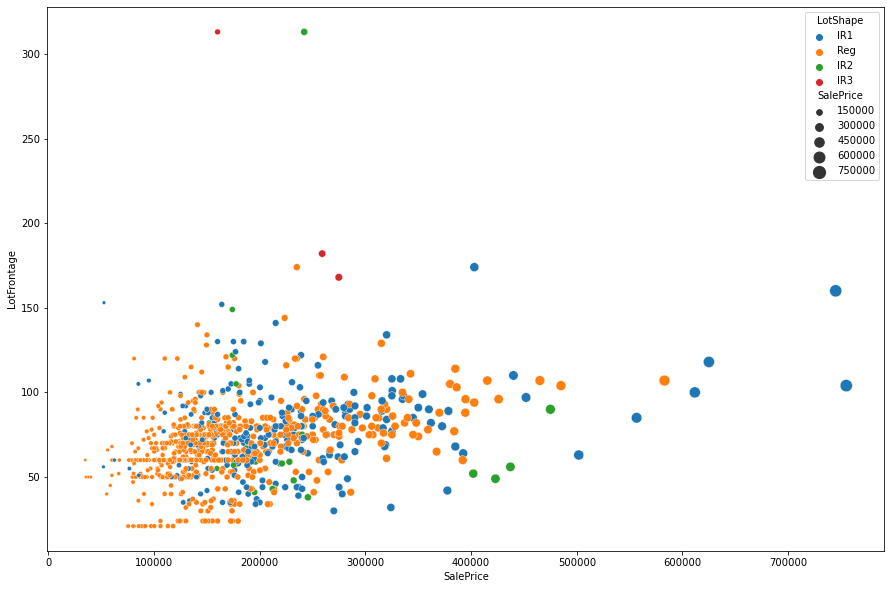

In [27]:
plt.figure(figsize=(15,10))
sb.scatterplot(x='SalePrice',y='LotFrontage',hue='LotShape',size='SalePrice',sizes=(10,150),data=Data_file)

* Some houses with Irregular Lot shape having high Lot frontage were sold at moderate price
* Slightly irregular shaped houses were sold at higher prices in comparison to Regular shaped houses if we consider Lot size to be almost same

<AxesSubplot:xlabel='SalePrice', ylabel='LotFrontage'>

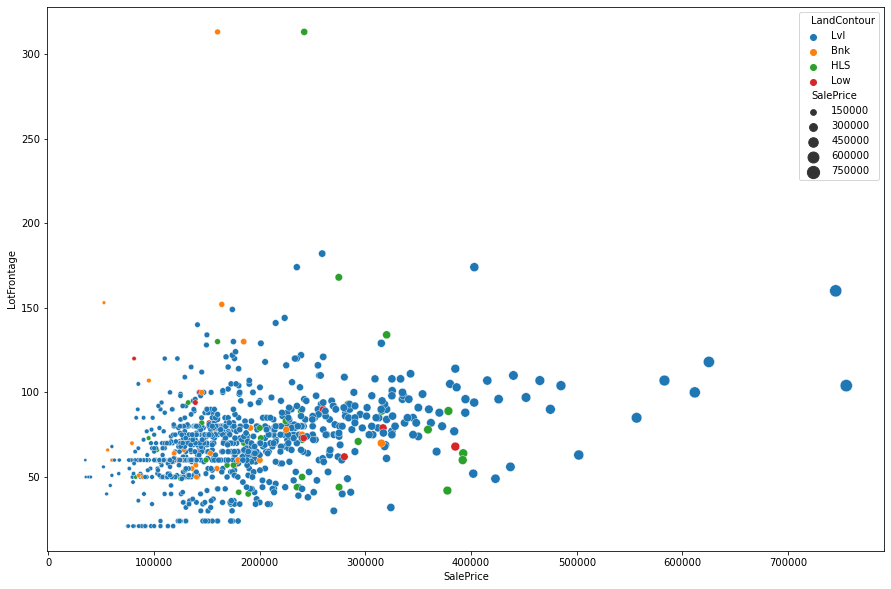

In [28]:
plt.figure(figsize=(15,10))
sb.scatterplot(x='SalePrice',y='LotFrontage',hue='LandContour',size='SalePrice',sizes=(10,150),data=Data_file)

* Lot frontage does not impact much when the house have hill side contour since same price houses have high as well as low Lot frontage

<AxesSubplot:xlabel='SalePrice', ylabel='LotFrontage'>

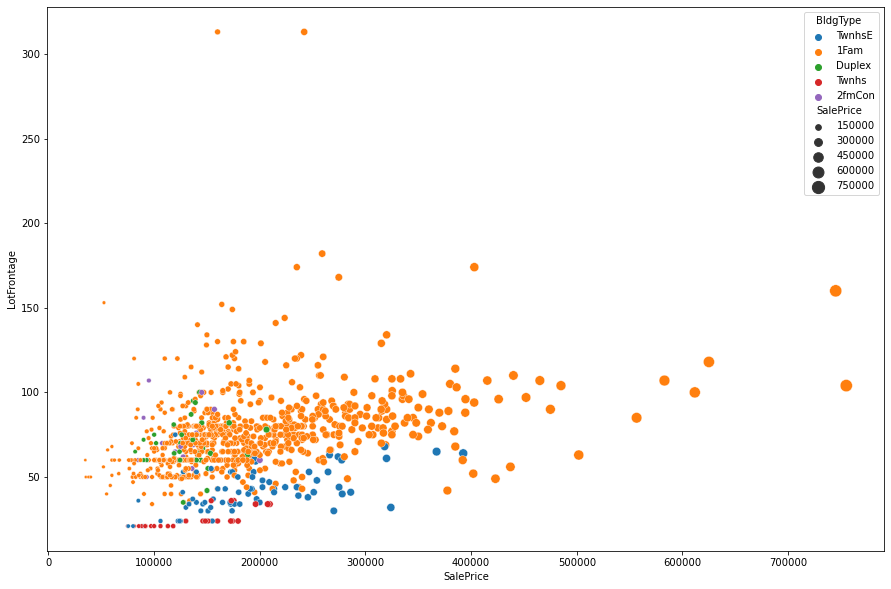

In [29]:
plt.figure(figsize=(15,10))
sb.scatterplot(x='SalePrice',y='LotFrontage',hue='BldgType',size='SalePrice',sizes=(10,150),data=Data_file)

* Houses having single family detached Building type were sold more and with high prices than those having townhouse end unit building type followedby Townhouse inside unit

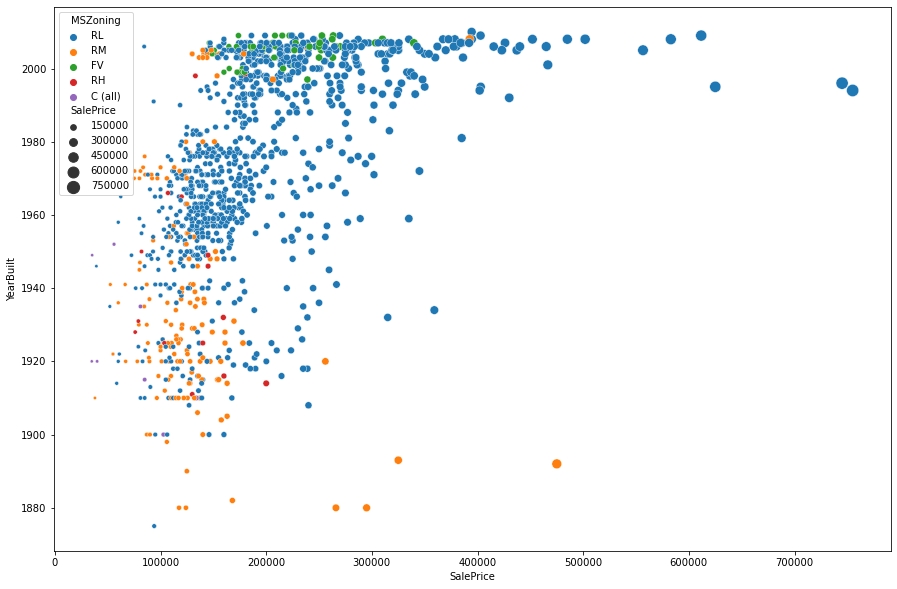

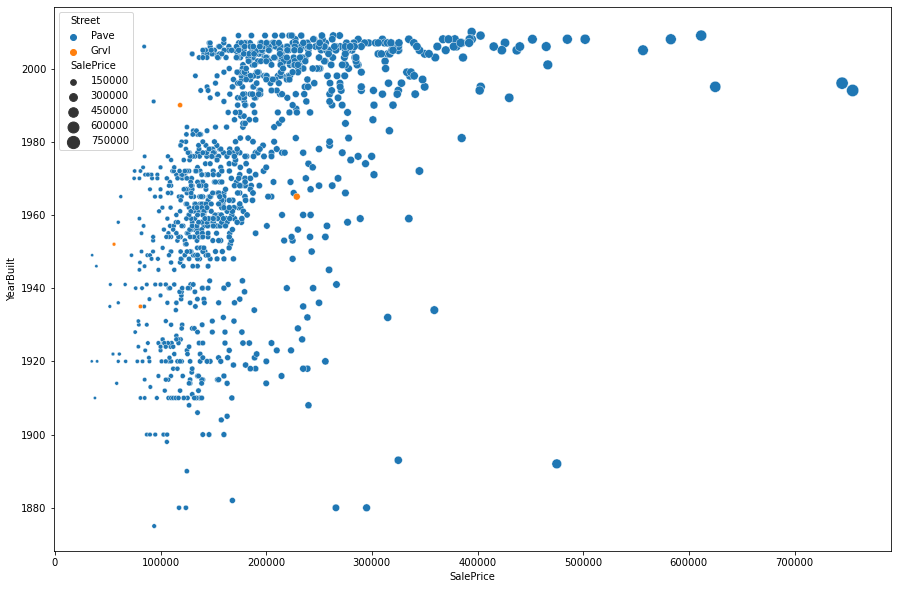

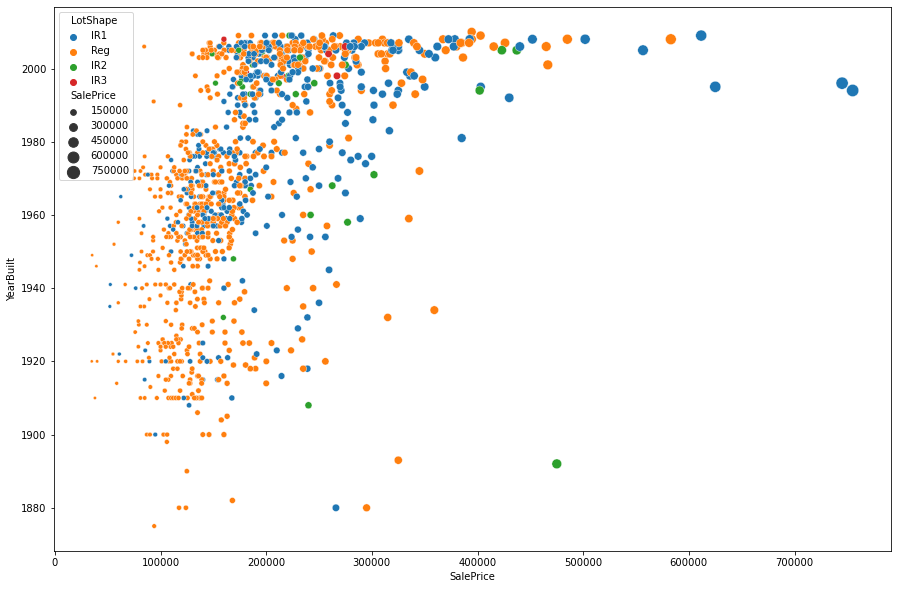

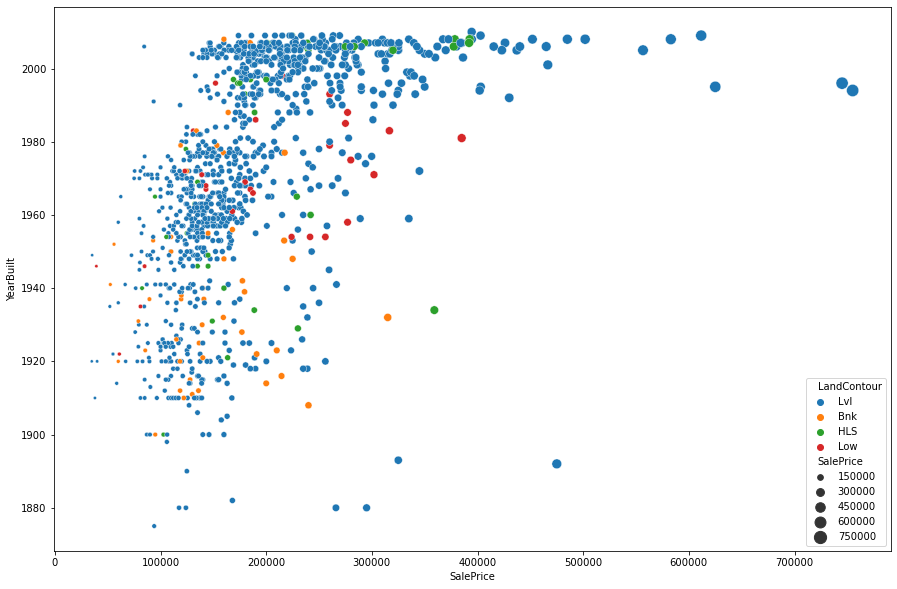

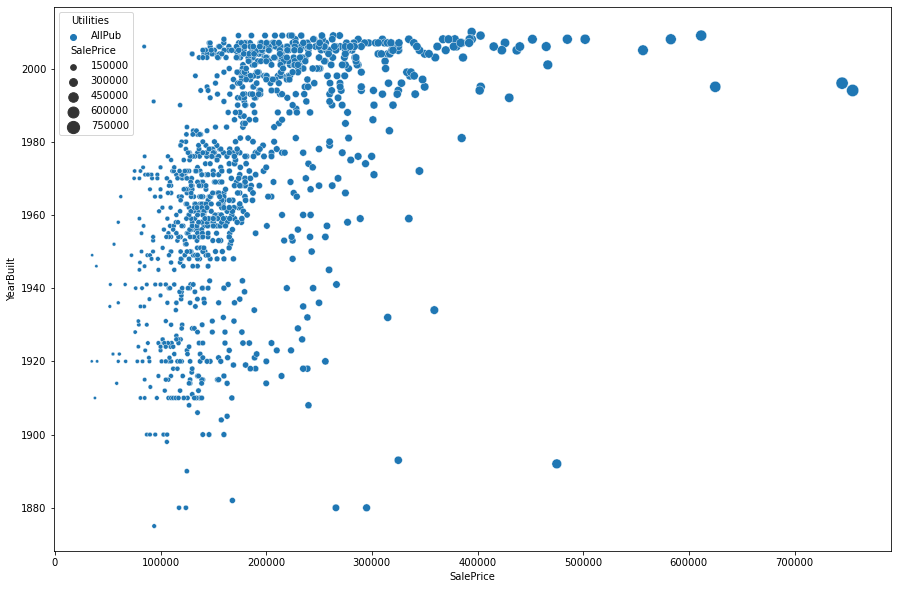

...

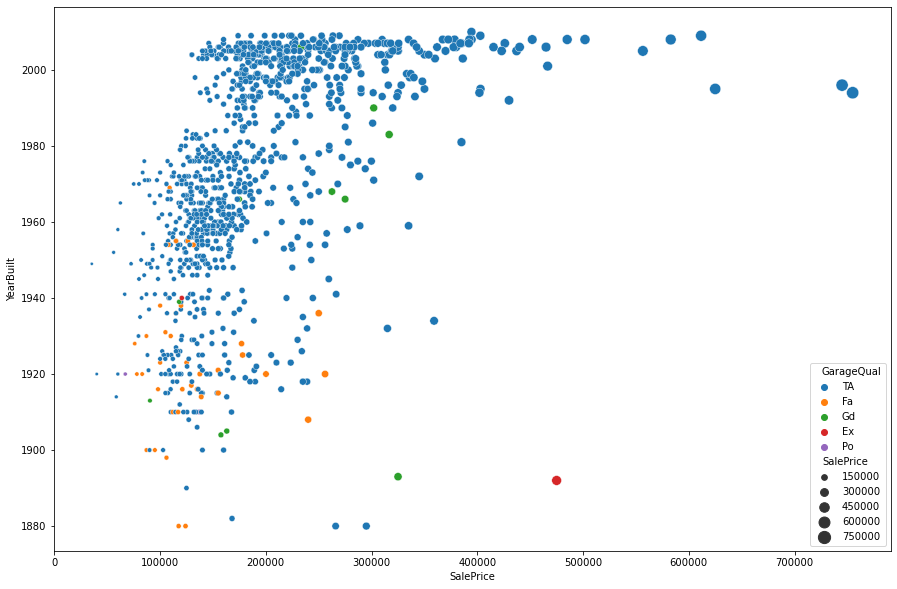

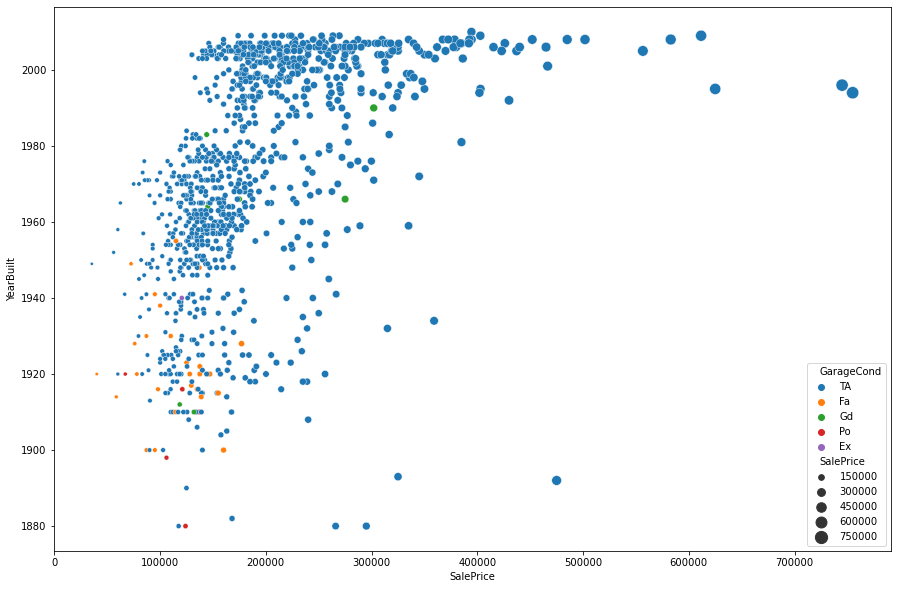

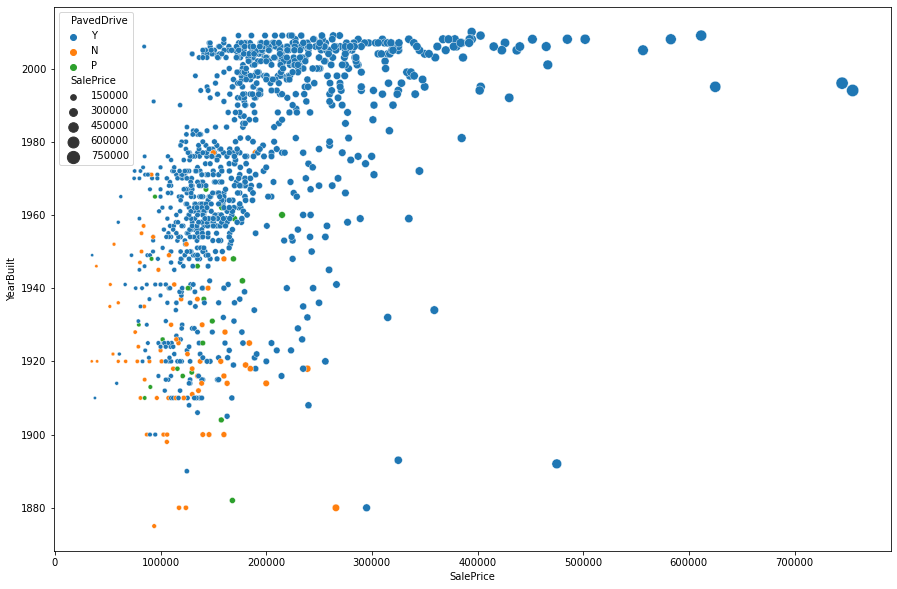

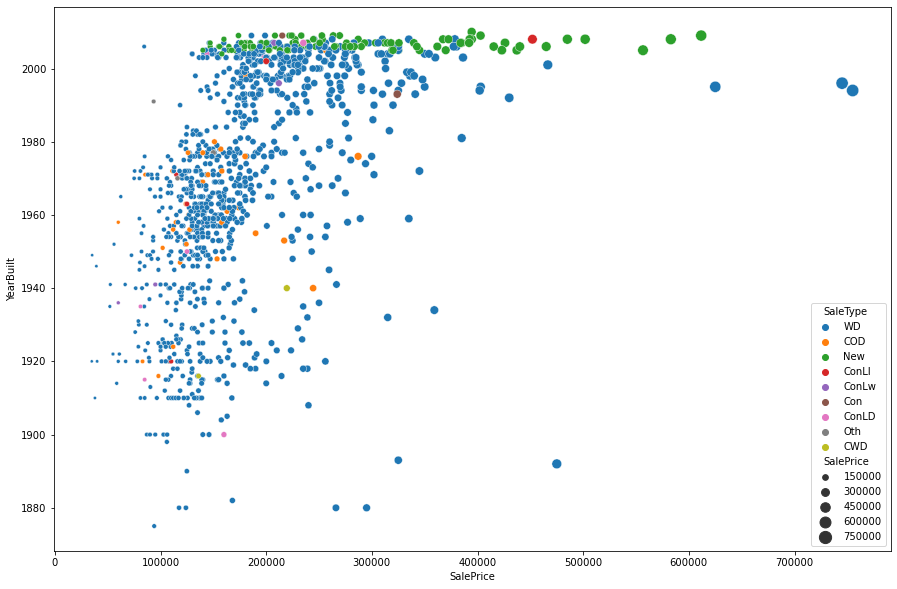

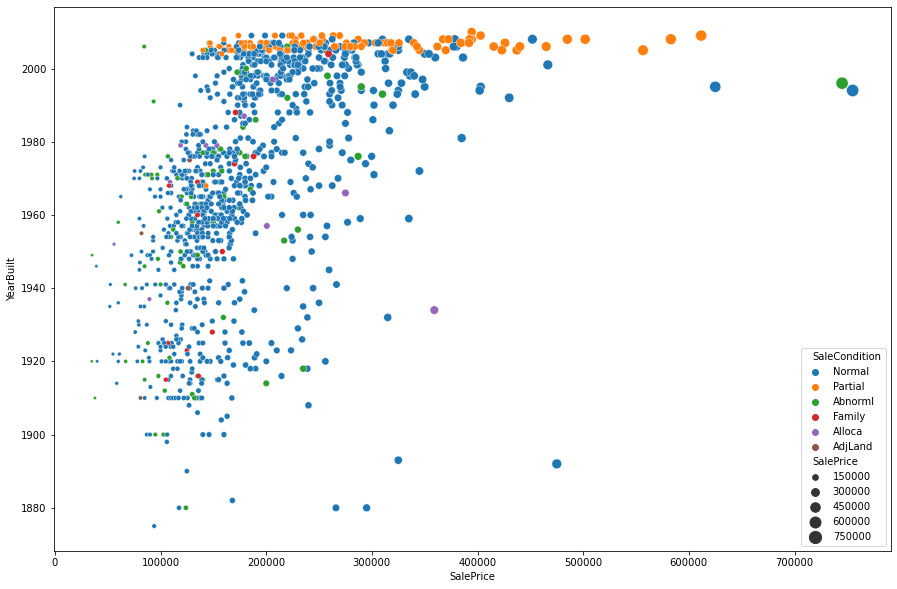

In [58]:
for i in str_cols:
    plt.subplots(figsize=(15,10))
    sb.scatterplot(x='SalePrice',y='YearBuilt',hue=i,size='SalePrice',sizes=(10,150),data=Data_file)


###### MSZoning

* HOuses built in year 1980 and above were sold at higher prices
* Also it can be seen that FV(Floating village resedential) houses were bult after 1995 and were sold at moderate prices
* Almost all RH Zoning houses were built brfore year 2000 and sold at low prices

###### Lot Shape
* All irregular shaped 3 houses were built after yr 2000 and sold at moderate price
* Slighly irregulr shaped houses prepared after yr 2000 were sold for higher prices than the ones built before 2000
* number of houses built is seen increasing with increase in time

###### Land Contour
* There are no houses sold after year 2000 having flatness category(Low) .
* Hillside slope and nearly flat houses were built more after year 2000
* very few houses with Banked contour are seen after yr 2000 and that too sold at very low prices
* so building houses having either hillside or nearly flat Land contour have very high probability to be sold at good prices

###### LandSlope
* As year advances houses havig gentle slope are seen to be sold most in number
* There is significant reduction of houses built with moderate slope after year 2000

###### BldgType
* With increase in the year of house built 1fam(single family detached) and Twnhse (townhouse end unit) were sold most in number where 1 fam houses were sold at very high prices in camparison to any other dwelling
* Significant decrease in  Duplex houses is seen after year 2000
* very few houses with dwelling type Twnhs

###### House Style
* After approx 1995 only 1story and 2 story houses were bulid and all other style seems to be vanished
* Very few houses with Sfoyer style were sold after 2000at very low prices

###### Roof Type
* Only Gable and Hip roof type houses were sold after 1980's
* Hip type roof style houses were sold at higher prices than Gable 

###### RoofMat1
* After 1980's almost all houses had Compshg(Standard(composite) Shingle) roof material
* Although wood shingles (WDshngl) houses are less but they are sold at high prices , after 1980's very few houses have Wdshngl and too highest sale price
* Very few houses ,built after 1980's, have wdShake type of roof material but they were sold at low prices

##### Exterior1st 
* After 1985 most of the houses built had exterior covering 'VinySd'(Vinyl siding) and houses having cement borad were less in number but had above average prices
* Houses having wood siding were built in very less number ,after the year 1995

######  MasVnrType
* Significant increase in houses having Masonry veneer type 'Stone' can be seen after year 2000 having price distribution from nmoderate to high
* Brick face masonry type houses are the second most sold houses after year 2000


##### External quality
* Significant increase in houses having external quality 'excellent' can be seen after year 2000
* Almost 90 % of the houses sold after 2000 have external quality Good or excellent whereas before 1985 90% of houses had average external quality


###### External condition
* Almost 90% of houses have average external condition irrespective of year

###### Foudation
* 95 to 99% houses built after 1985 have foundation type as poured concrete (pconc)
* 90% of houses built in between 1940 and 1985 had cinder block(CBlock) foundation
* 90% of houses built before 1940 had Brick and tile foundation

###### BsmtQuality
* It can be clearly seen that only good and excellent basement quality houses were built after 1990

###### BsmtFintype1
* 90% of houses built after 1985 had GLQ (good living quarter) or UNf(unfinished) rating of basement finished area
* very few houses with BLQ(below average living area) rating type of basement finished area

###### HeatingQC
* 90% of houses built after 2000 have excellent heating quality and condition
* Very few houses with good heating quality were sold at low prices than excellent ones

###### Kitchen quality
* 90% of Houses built after 2000 have excellent or good quality where excellent ones were sold at higher prices

###### Fireplace Quality
* After 2000 good,excellent or average fire place quality houses were built
* Very few were average quality and were sold at low prices .The ones with good quality are high in number but sold at moderate prices whereas the ones with excellent quality were sold at high prices comparitively

###### Garagetype
* 90% of houses built after 1985 have garage type 'Attchd'(Attached to home) or 'BuiltIn'(Garage part of house) and very few houses have Detached garages. Detached garage houses were sold at comparitively low prices than Attached and BuiltIn

###### Garage Finish
* Almost all houses built after 2000 have Rfn (Rough finished) and Fin(Unfinished) type of Garage finish

###### SAle type
* Significant increase in houses having sale type New (just constructed and sold) can be seen after 2000 and that too at higher prices
* Very few houses were WD (warranty deed -conventional) and sold at comparitively low prices

###### SAle condition
* There are significant number of houses sold before being completed (Partial) after year 2000 along with normal sale condition

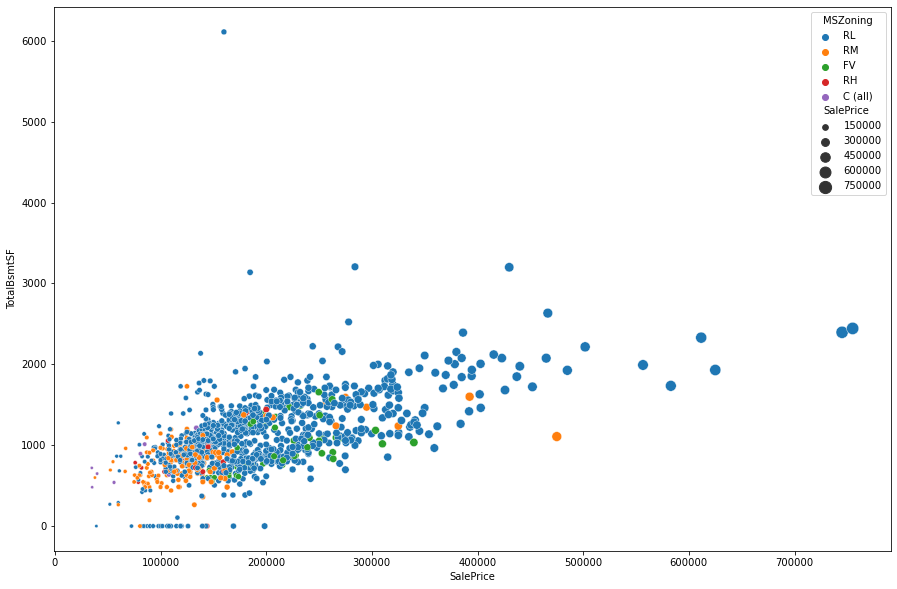

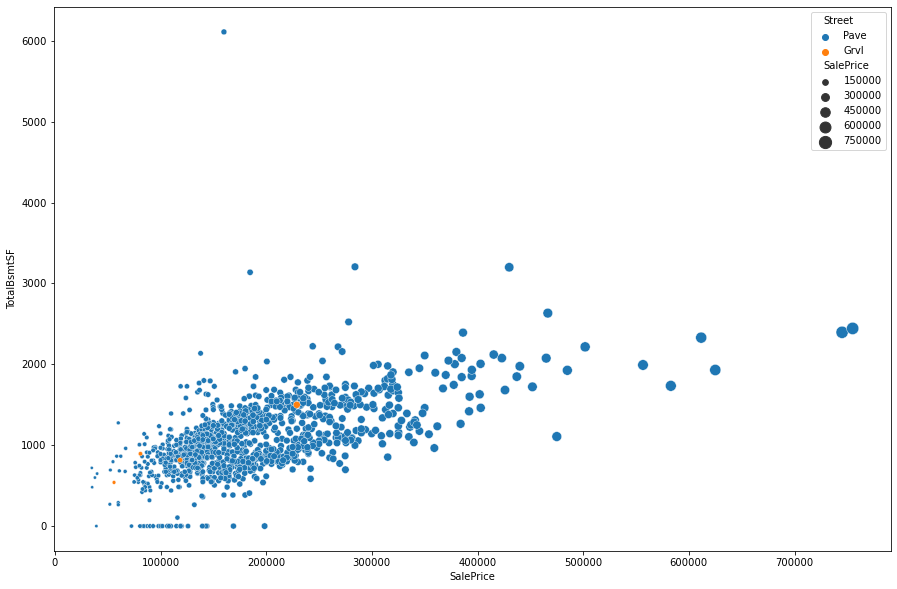

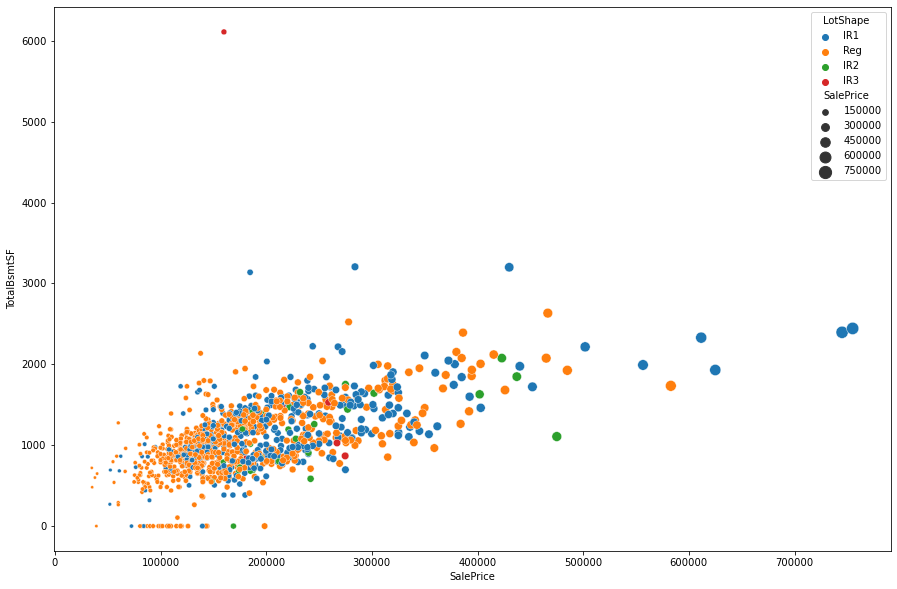

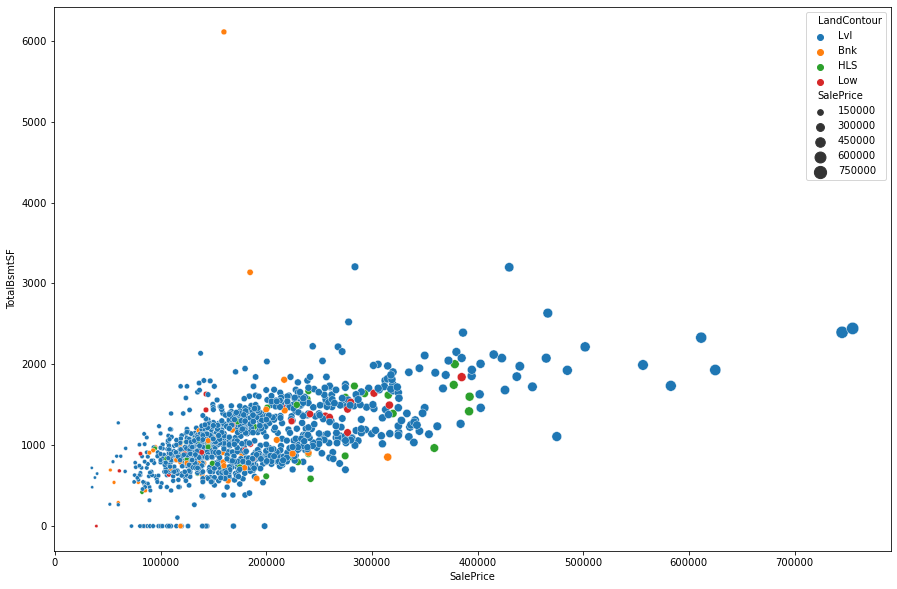

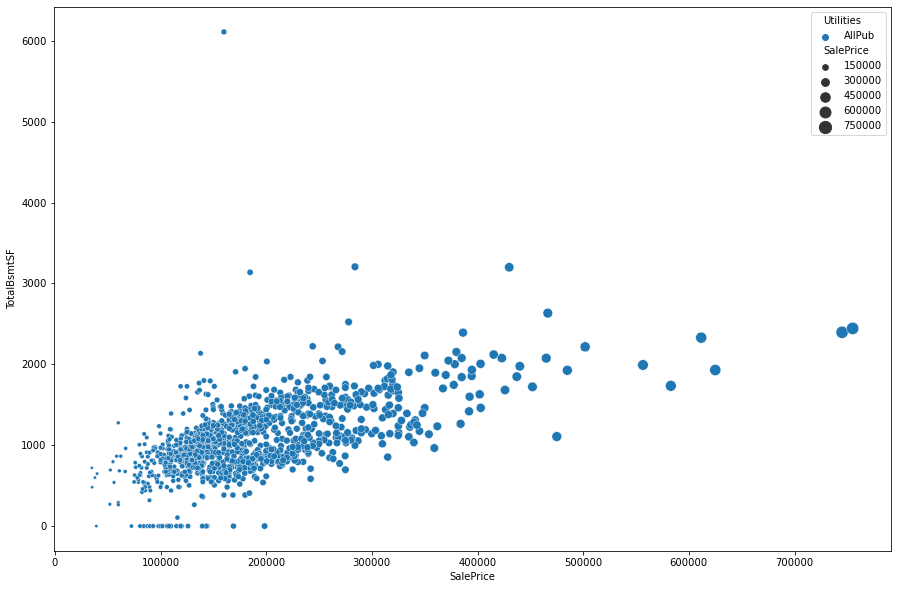

...

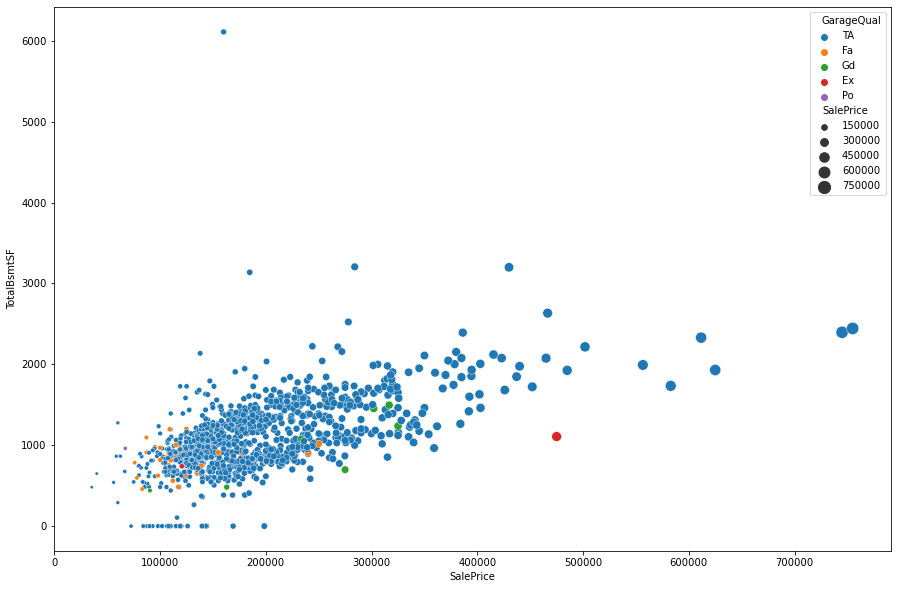

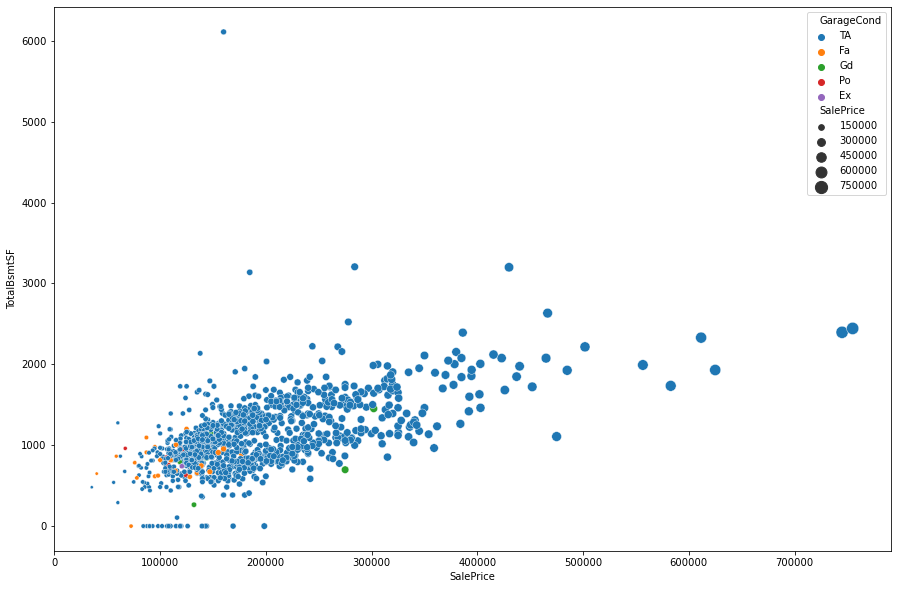

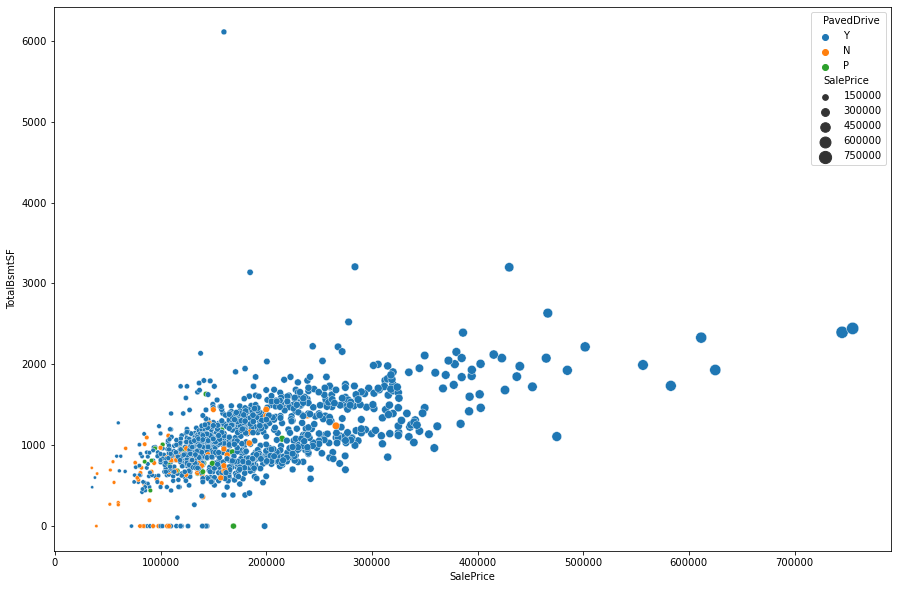

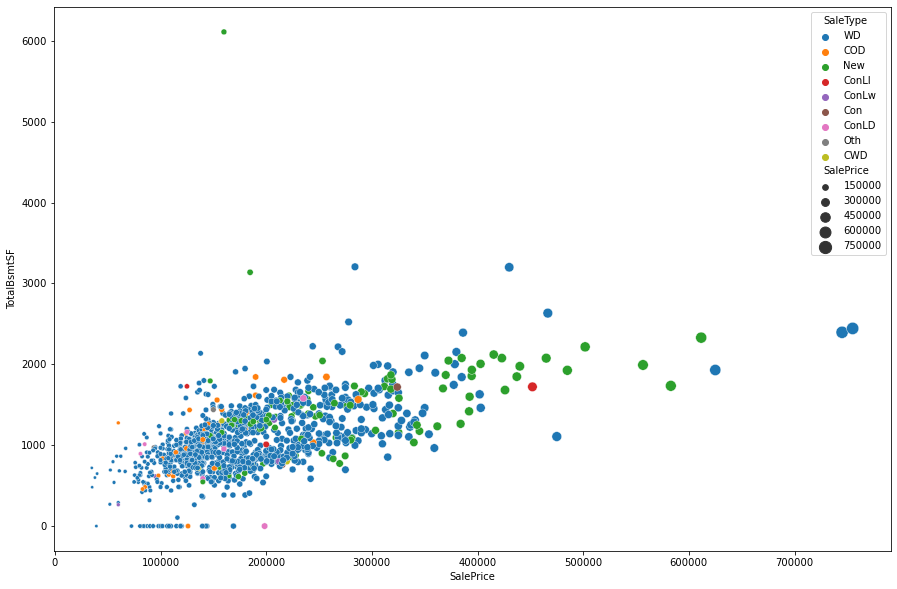

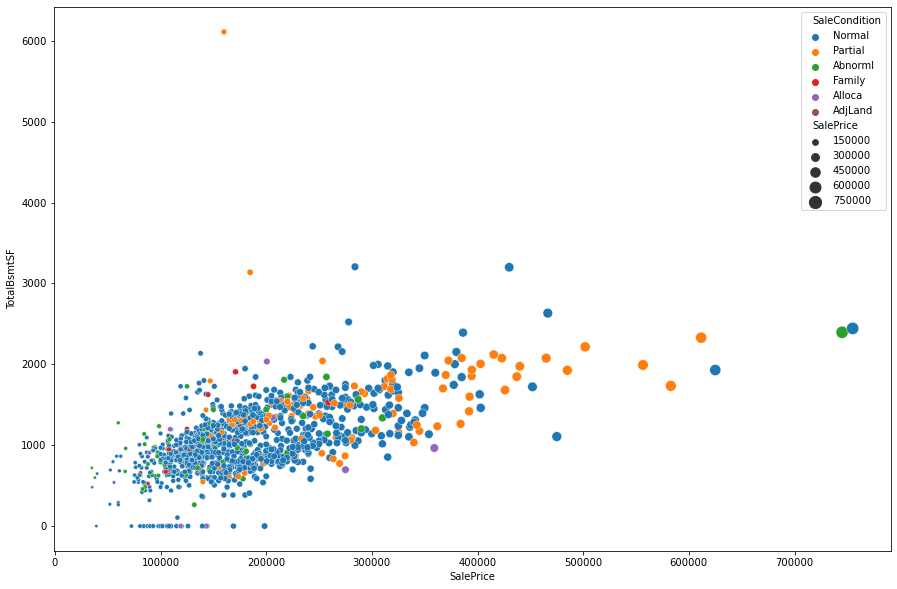

In [43]:
for i in str_cols:
    plt.subplots(figsize=(15,10))
    sb.scatterplot(x='SalePrice',y='TotalBsmtSF',hue=i,size='SalePrice',sizes=(10,150),data=Data_file)


In [48]:
numerical_cols

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'Fireplaces',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

In [25]:
Data_file.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'Scr

## Data Preprocessing

In [25]:
## Making a copy of dataset
Data_file_preprocess=Data_file.copy()

##### 1. Dealing with NAN values

In [26]:
## viewing all columns with null values along with their percentage
df_nan=pd.DataFrame(Data_file_preprocess[Data_file_preprocess.columns[Data_file_preprocess.isna().any()]].isna().sum())
df_nan.columns=['null_values']
df_nan['% of null values']=df_nan['null_values']/11.68
df_nan

,null_values,% of null values
LotFrontage,214,18.321918
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658
GarageType,64,5.479452


In [27]:
## checking values in each attribute before dealing with their null values
for i in df_nan.index:
    print(Data_file_preprocess[i].value_counts())

60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
        ... 
112.0      1
111.0      1
144.0      1
102.0      1
149.0      1
Name: LotFrontage, Length: 106, dtype: int64
None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64
0.0      692
72.0       7
120.0      6
180.0      6
106.0      5
        ... 
443.0      1
105.0      1
894.0      1
650.0      1
567.0      1
Name: MasVnrArea, Length: 283, dtype: int64
TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64
TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64
No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64
Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64
Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64
Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64
Attchd     691
Detchd     314
Bui

In [28]:
## repalacing Lot frontage area with the mean area (floored value)
Data_file_preprocess['LotFrontage'].replace(np.nan,math.floor(Data_file_preprocess['LotFrontage'].mean()),inplace=True)

### Masonry veneer type has only 7 nan values hence repalcing them by the most occuring value
Data_file_preprocess['MasVnrType'].replace(np.nan,Data_file_preprocess['MasVnrType'].mode()[0],inplace=True)

### Masonry veneer type also have 7 nan values so dealing the same was as masonry veneer type
Data_file_preprocess['MasVnrArea'].replace(np.nan,Data_file_preprocess['MasVnrArea'].mode()[0],inplace=True)

## basement quality and basement condition is categorical hence replacing with most occuring value which is 'TA'
Data_file_preprocess['BsmtQual'].replace(np.nan,Data_file_preprocess['BsmtQual'].mode()[0],inplace=True)
Data_file_preprocess['BsmtCond'].replace(np.nan,Data_file_preprocess['BsmtCond'].mode()[0],inplace=True)

## basement exposure  is categorical and more than 50% of houses No basement hence replacing BsmtExposure with the mode
Data_file_preprocess['BsmtExposure'].replace(np.nan,Data_file_preprocess['BsmtExposure'].mode()[0],inplace=True)

## Rating of basement finished area 1 and 2 is also categoricaland 2% values are nan  hence replacing BsmtFinType1 with the mode
Data_file_preprocess['BsmtFinType1'].replace(np.nan,Data_file_preprocess['BsmtFinType1'].mode()[0],inplace=True)
Data_file_preprocess['BsmtFinType2'].replace(np.nan,Data_file_preprocess['BsmtFinType2'].mode()[0],inplace=True)

## Fira place quality (FireplaceQu) is also categotrical and 47 % values are nan. replacing with Average quality (TA) for all nan's
Data_file_preprocess['FireplaceQu'].replace(np.nan,'TA',inplace=True)

## Replacing Garage info columns with their respective modes
Data_file_preprocess['GarageType'].replace(np.nan,Data_file_preprocess['GarageType'].mode()[0],inplace=True)
Data_file_preprocess['GarageFinish'].replace(np.nan,Data_file_preprocess['GarageFinish'].mode()[0],inplace=True)
Data_file_preprocess['GarageQual'].replace(np.nan,Data_file_preprocess['GarageQual'].mode()[0],inplace=True)
Data_file_preprocess['GarageCond'].replace(np.nan,Data_file_preprocess['GarageCond'].mode()[0],inplace=True)

In [29]:
## checking again incase of null values
Data_file_preprocess[Data_file_preprocess.columns[Data_file_preprocess.isna().any()]].isna().sum()

Series([], dtype: float64)

* Dataset free from null values

##### 2. Converting all strings attributes  to numericals using Label encoder

In [30]:
from sklearn.preprocessing import LabelEncoder
#### making an empty list to collect Label encoder object against each string attribute
list_encoder=[]
for k,i in zip(range(len(str_cols)),str_cols):
    list_encoder.append((LabelEncoder(),i))
    list_encoder[k][0].fit(Data_file_preprocess[i])
    Data_file_preprocess[i]=list_encoder[k][0].transform(Data_file_preprocess[i])

##### 3. Dealing with outliers

In [32]:
## since we have very less data hence considering 99% data and removing last 1 percentile
cutoff = Data_file_preprocess.quantile(0.99)
Data_no_outlier = Data_file_preprocess[~((Data_file_preprocess > (cutoff))).any(axis=1)]
print(Data_file_preprocess.shape,'\n',Data_no_outlier.shape)
print(Data_file_preprocess.shape[0]-Data_no_outlier.shape[0],' rows removed as outliers')

(1168, 73) 
 (951, 73)
217  rows removed as outliers


##### 4.Checking skewnes of data 

In [33]:
Data_no_outlier.iloc[:,:35].skew()

Id              -0.001027
MSSubClass       1.404453
MSZoning        -1.652748
LotFrontage      0.231220
LotArea          1.097771
Street         -21.771469
LotShape        -0.698568
LandContour     -3.345347
Utilities        0.000000
LotConfig       -1.212513
LandSlope        4.636288
Neighborhood     0.076187
Condition1       2.559813
Condition2     -15.992960
BldgType         2.246816
HouseStyle       0.291391
OverallQual      0.070087
OverallCond      0.671937
YearBuilt       -0.546156
YearRemodAdd    -0.465879
RoofStyle        1.646582
RoofMatl        15.622504
Exterior1st     -0.623908
Exterior2nd     -0.608884
MasVnrType      -0.125773
MasVnrArea       1.915802
ExterQual       -1.695447
ExterCond       -2.557579
Foundation      -0.346347
BsmtQual        -1.382165
BsmtCond        -3.450187
BsmtExposure    -1.279698
BsmtFinType1    -0.068781
BsmtFinSF1       0.603213
BsmtFinType2    -3.913651
dtype: float64

In [34]:
Data_no_outlier.iloc[:,35:].skew()

BsmtFinSF2        4.206943
BsmtUnfSF         0.759394
TotalBsmtSF       0.079121
Heating           7.442796
HeatingQC         0.414242
CentralAir       -3.836369
Electrical       -3.145639
2ndFlrSF          0.713888
LowQualFinSF     13.103048
GrLivArea         0.509056
BsmtFullBath      0.458484
BsmtHalfBath      4.063812
FullBath          0.018433
HalfBath          0.566983
BedroomAbvGr     -0.130081
KitchenAbvGr      4.928106
KitchenQual      -1.440634
Functional       -4.077101
Fireplaces        0.583550
FireplaceQu      -1.265510
GarageType        0.807938
GarageFinish     -0.495330
GarageArea       -0.089890
GarageQual       -4.790133
GarageCond       -5.219316
PavedDrive       -3.354903
WoodDeckSF        1.076175
OpenPorchSF       1.496717
EnclosedPorch     2.715889
3SsnPorch        11.042489
ScreenPorch       3.792763
PoolArea          0.000000
MiscVal           6.620822
MoSold            0.210235
YrSold            0.126764
SaleType         -3.792238
SaleCondition    -2.857558
S

* Some attributes are highly skewed

In [35]:
## using yeo johnson's method in power transformer to deal with skewness
from sklearn.preprocessing import PowerTransformer
## declaring empty list to store each power transformer object in list
pt=[]
k=0
## excluding target attribute
for i in Data_no_outlier.iloc[:,:-1].columns:
    if((abs(Data_no_outlier[i].skew()))>0.55):
        pt.append([PowerTransformer(),i])
        pt[k][0].fit(Data_no_outlier[i].values.reshape(-1,1))
        Data_no_outlier[i]=pt[k][0].transform(Data_no_outlier[i].values.reshape(-1,1))
        k=k+1

In [36]:
Data_no_outlier.iloc[:,:35].skew()

Id              -0.001027
MSSubClass       0.076192
MSZoning         0.215022
LotFrontage      0.231220
LotArea          0.124439
Street         -21.771469
LotShape        -0.687835
LandContour     -2.884001
Utilities        0.000000
LotConfig       -1.116722
LandSlope        4.636288
Neighborhood     0.076187
Condition1       0.384823
Condition2     -13.703923
BldgType         1.860580
HouseStyle       0.291391
OverallQual      0.070087
OverallCond      0.011349
YearBuilt       -0.546156
YearRemodAdd    -0.465879
RoofStyle       -0.930930
RoofMatl        15.345907
Exterior1st     -0.347020
Exterior2nd     -0.363545
MasVnrType      -0.125773
MasVnrArea       0.452270
ExterQual       -0.599858
ExterCond       -2.329082
Foundation      -0.346347
BsmtQual        -0.370673
BsmtCond        -3.184770
BsmtExposure    -1.023437
BsmtFinType1    -0.068781
BsmtFinSF1      -0.418547
BsmtFinType2    -2.717161
dtype: float64

In [37]:
Data_no_outlier.iloc[:,35:].skew()

BsmtFinSF2        2.712453
BsmtUnfSF        -0.279294
TotalBsmtSF       0.079121
Heating          -1.051353
HeatingQC         0.414242
CentralAir       -3.836369
Electrical       -3.052973
2ndFlrSF          0.297065
LowQualFinSF      9.150426
GrLivArea         0.509056
BsmtFullBath      0.458484
BsmtHalfBath      4.063812
FullBath          0.018433
HalfBath          0.566983
BedroomAbvGr     -0.130081
KitchenAbvGr      4.928106
KitchenQual      -0.375256
Functional       -3.426908
Fireplaces        0.120284
FireplaceQu      -0.952560
GarageType        0.318324
GarageFinish     -0.495330
GarageArea       -0.089890
GarageQual       -4.569986
GarageCond       -4.928106
PavedDrive       -3.103308
WoodDeckSF        0.153227
OpenPorchSF       0.013463
EnclosedPorch     2.067499
3SsnPorch        10.148942
ScreenPorch       3.362361
PoolArea          0.000000
MiscVal           5.931099
MoSold            0.210235
YrSold            0.126764
SaleType         -2.186466
SaleCondition    -0.269387
S

* Skewness handled to much extent

##### 5. Scaling the data

In [38]:
## using standrard scaler to scale the data
from sklearn.preprocessing import StandardScaler
ss=[]
k=0
for i in Data_no_outlier.iloc[:,:-1].columns:
    ss.append([StandardScaler(),i])
    ss[k][0].fit(Data_no_outlier[i].values.reshape(-1,1))
    Data_no_outlier[i]=ss[k][0].transform(Data_no_outlier[i].values.reshape(-1,1))
    k=k+1

In [39]:
### Again checking skewness to see if scaling have not disturbed the skewness
Data_no_outlier.iloc[:,:35].skew()

Id              -0.001027
MSSubClass       0.076192
MSZoning         0.215022
LotFrontage      0.231220
LotArea          0.124439
Street         -21.771469
LotShape        -0.687835
LandContour     -2.884001
Utilities        0.000000
LotConfig       -1.116722
LandSlope        4.636288
Neighborhood     0.076187
Condition1       0.384823
Condition2     -13.703923
BldgType         1.860580
HouseStyle       0.291391
OverallQual      0.070087
OverallCond      0.011349
YearBuilt       -0.546156
YearRemodAdd    -0.465879
RoofStyle       -0.930930
RoofMatl        15.345907
Exterior1st     -0.347020
Exterior2nd     -0.363545
MasVnrType      -0.125773
MasVnrArea       0.452270
ExterQual       -0.599858
ExterCond       -2.329082
Foundation      -0.346347
BsmtQual        -0.370673
BsmtCond        -3.184770
BsmtExposure    -1.023437
BsmtFinType1    -0.068781
BsmtFinSF1      -0.418547
BsmtFinType2    -2.717161
dtype: float64

In [40]:
Data_no_outlier.iloc[:,35:].skew()

BsmtFinSF2        2.712453
BsmtUnfSF        -0.279294
TotalBsmtSF       0.079121
Heating          -1.051353
HeatingQC         0.414242
CentralAir       -3.836369
Electrical       -3.052973
2ndFlrSF          0.297065
LowQualFinSF      9.150426
GrLivArea         0.509056
BsmtFullBath      0.458484
BsmtHalfBath      4.063812
FullBath          0.018433
HalfBath          0.566983
BedroomAbvGr     -0.130081
KitchenAbvGr      4.928106
KitchenQual      -0.375256
Functional       -3.426908
Fireplaces        0.120284
FireplaceQu      -0.952560
GarageType        0.318324
GarageFinish     -0.495330
GarageArea       -0.089890
GarageQual       -4.569986
GarageCond       -4.928106
PavedDrive       -3.103308
WoodDeckSF        0.153227
OpenPorchSF       0.013463
EnclosedPorch     2.067499
3SsnPorch        10.148942
ScreenPorch       3.362361
PoolArea          0.000000
MiscVal           5.931099
MoSold            0.210235
YrSold            0.126764
SaleType         -2.186466
SaleCondition    -0.269387
S

* Skewness is not disturbed

In [41]:
## Dropping unnecessary columns like 'ID' since it is just a unique number to each row
Data_no_outlier.drop(['Id'],inplace=True,axis=1)

In [42]:
Data_file.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,...,0,0,224,0,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,6,2009,WD,Normal,215000


In [43]:
Data_no_outlier.corr()['SalePrice'][:35]

MSSubClass      0.036303
MSZoning       -0.266262
LotFrontage     0.339258
LotArea         0.315887
Street          0.062275
LotShape       -0.251276
LandContour    -0.018730
Utilities            NaN
LotConfig      -0.038468
LandSlope       0.036722
Neighborhood    0.159008
Condition1      0.134780
Condition2      0.069705
BldgType       -0.100490
HouseStyle      0.239621
OverallQual     0.797611
OverallCond    -0.079623
YearBuilt       0.607059
YearRemodAdd    0.552172
RoofStyle       0.090578
RoofMatl       -0.022889
Exterior1st     0.166673
Exterior2nd     0.169450
MasVnrType     -0.019743
MasVnrArea      0.410290
ExterQual      -0.633504
ExterCond       0.163979
Foundation      0.462485
BsmtQual       -0.625354
BsmtCond        0.024997
BsmtExposure   -0.278036
BsmtFinType1   -0.085368
BsmtFinSF1      0.200392
BsmtFinType2    0.078458
BsmtFinSF2     -0.078895
Name: SalePrice, dtype: float64

In [44]:
Data_no_outlier.corr()['SalePrice'][35:]

BsmtUnfSF        0.184917
TotalBsmtSF      0.581494
Heating          0.005252
HeatingQC       -0.470592
CentralAir       0.256953
Electrical       0.249522
2ndFlrSF         0.183011
LowQualFinSF    -0.079119
GrLivArea        0.713944
BsmtFullBath     0.230892
BsmtHalfBath    -0.020921
FullBath         0.614077
HalfBath         0.303531
BedroomAbvGr     0.200438
KitchenAbvGr    -0.132366
KitchenQual     -0.577917
Functional       0.131989
Fireplaces       0.436260
FireplaceQu     -0.308462
GarageType      -0.286642
GarageFinish    -0.564510
GarageArea       0.639474
GarageQual       0.126078
GarageCond       0.152428
PavedDrive       0.254548
WoodDeckSF       0.330235
OpenPorchSF      0.501273
EnclosedPorch   -0.182658
3SsnPorch        0.071474
ScreenPorch      0.059382
PoolArea              NaN
MiscVal         -0.097552
MoSold           0.124263
YrSold          -0.069411
SaleType        -0.190347
SaleCondition    0.333171
SalePrice        1.000000
Name: SalePrice, dtype: float64

##### 6. Transforming target column by taking log, to get better visuals and minimize the error

In [45]:
### Antilog will be taken after prediction so that acutal values can be obtained
Data_no_outlier['SalePrice']=np.log(Data_no_outlier['SalePrice'])

### Model preparation

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error,mean_squared_log_error
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

In [47]:
## separating dependent and independent features
X=Data_no_outlier.iloc[:,0:-1]
Y=Data_no_outlier.iloc[:,-1]

In [48]:
### preparing a method which will give all metrices score for the algorithm which is passed in it
def model_scores(x,y,test_size,model):
    train_x,test_x,train_y,test_y=train_test_split(x,y,test_size=0.2,random_state=42)
    model.fit(train_x,train_y)
    pred=model.predict(test_x)
    print('r2_score :',r2_score(test_y,pred).round(4))
    list_r2score.append((r2_score(test_y,pred).round(4)))
    list_MSE.append(mean_squared_error(test_y,pred).round(4))
    list_MAE.append(mean_absolute_error(test_y,pred).round(4))
    list_RMSE.append(np.sqrt(mean_squared_error(test_y,pred)).round(4))
    list_MSLE.append(abs(mean_squared_log_error(test_y,pred)).round(4))

In [49]:
list_r2score=[]
list_MSE=[]
list_MAE=[]
list_RMSE=[]
list_MSLE=[]
model_list=[LinearRegression(),KNeighborsRegressor(),DecisionTreeRegressor(),Lasso(alpha=0.001),Ridge(alpha=0.001),
            SVR()]
for i in model_list:
    model_scores(X,Y,0.2,i)
colv=['LinearRegression','KNN','DecisionTree','Lasso','Ridge','SVR']
pd.set_option('display.float_format', lambda x: '%.6f' % x)
#pd.reset_option('display.float_format')
df=pd.DataFrame([list_r2score,list_MSE,list_MAE,list_RMSE,list_MSLE],index=['R2','MSE','MAE','RMSE','MS_log_error'],
                columns=colv)


r2_score : 0.8835
r2_score : 0.778
r2_score : 0.6889
r2_score : 0.8897
r2_score : 0.8841
r2_score : 0.7976


In [50]:
## displaying all scores given by different algorithm
df

,LinearRegression,KNN,DecisionTree,Lasso,Ridge,SVR
R2,0.883500,0.778000,0.688900,0.889700,0.884100,0.797600
MSE,0.013500,0.025700,0.036000,0.012800,0.013400,0.023400
MAE,0.085300,0.118400,0.135700,0.083300,0.085000,0.103600
RMSE,0.116100,0.160300,0.189700,0.113000,0.115800,0.153100
MS_log_error,0.000100,0.000200,0.000200,0.000100,0.000100,0.000100


* As can be seen clearly Lasso regularization technique is giving best result among all

###### checking for overfitting / underfitting 

In [51]:
from sklearn.model_selection import cross_val_score
scores=cross_val_score(Lasso(alpha=0.001),X,Y,cv=5,scoring='neg_mean_squared_error')
print(scores)
print(scores.mean(),scores.std())

[-0.01083775 -0.01198215 -0.01278363 -0.01459851 -0.01894884]
-0.01383017420146114 0.002837467582675256


* Model is not overfitted

##### Preparing a method for Hyperparameter Tuning

In [52]:
##### creating a method to perform hyperparameter tuning using Grid search
from sklearn.model_selection import GridSearchCV
def gridsearch(x,y,model,parameter_dictionary):
    grid_cv=GridSearchCV(estimator=model,param_grid=parameter_dictionary,cv=5,scoring='r2')
    grid_cv.fit(x,y)
    print('\n')
    print('best Parameter :',grid_cv.best_params_)

In [53]:
gridsearch(X,Y,Lasso(),{'alpha':[0.005, 0.02, 0.03, 0.05, 0.06]})



best Parameter : {'alpha': 0.005}


In [54]:
model_scores(X,Y,0.2,Lasso(alpha=0.005))
colv.append('Lasso(Hypertuned)')
df=pd.DataFrame([list_r2score,list_MSE,list_MAE,list_RMSE,list_MSLE],index=['R2','MSE','MAE','RMSE','MS_log_error'],columns=colv)

r2_score : 0.895


In [55]:
df

,LinearRegression,KNN,DecisionTree,Lasso,Ridge,SVR,Lasso(Hypertuned)
R2,0.883500,0.778000,0.688900,0.889700,0.884100,0.797600,0.895000
MSE,0.013500,0.025700,0.036000,0.012800,0.013400,0.023400,0.012200
MAE,0.085300,0.118400,0.135700,0.083300,0.085000,0.103600,0.080000
RMSE,0.116100,0.160300,0.189700,0.113000,0.115800,0.153100,0.110200
MS_log_error,0.000100,0.000200,0.000200,0.000100,0.000100,0.000100,0.000100


* R2 Score improved by 1 % and MSE and RMSE also decreased

##### Trying ensemble techniques

In [56]:
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor,AdaBoostRegressor
ensemble_models=[RandomForestRegressor(),AdaBoostRegressor(),GradientBoostingRegressor()]
for i,k in zip(ensemble_models,['RandomForestClassifier','AdaBoostClassifier','GradientBoostingClassifier']):
    print('******************',k,'****************')
    model_scores(X,Y,0.2,i)

colv.append('RandomForest')
colv.append('AdaBoost')
colv.append('GradientBoosting')
df=pd.DataFrame([list_r2score,list_MSE,list_MAE,list_RMSE,list_MSLE],index=['R2','MSE','MAE','RMSE','MS_log_error'],columns=colv)

****************** RandomForestClassifier ****************
r2_score : 0.8703
****************** AdaBoostClassifier ****************
r2_score : 0.7807
****************** GradientBoostingClassifier ****************
r2_score : 0.8966


In [57]:
df

,LinearRegression,KNN,DecisionTree,Lasso,Ridge,SVR,Lasso(Hypertuned),RandomForest,AdaBoost,GradientBoosting
R2,0.883500,0.778000,0.688900,0.889700,0.884100,0.797600,0.895000,0.870300,0.780700,0.896600
MSE,0.013500,0.025700,0.036000,0.012800,0.013400,0.023400,0.012200,0.015000,0.025400,0.012000
MAE,0.085300,0.118400,0.135700,0.083300,0.085000,0.103600,0.080000,0.089400,0.125400,0.080300
RMSE,0.116100,0.160300,0.189700,0.113000,0.115800,0.153100,0.110200,0.122500,0.159300,0.109400
MS_log_error,0.000100,0.000200,0.000200,0.000100,0.000100,0.000100,0.000100,0.000100,0.000200,0.000100


* As can be seen, GradientBoosting is working best in all endemble techniques hence trying to tune Gradient Boosting

##### Doing step wise Hyperparameter tuning for Gradient Boosting

In [58]:
################## Tuning n_estimators and Learning rate ##########################
para_dict1={'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001], 'n_estimators':[100,250,750,1000,1750]}
gridsearch(X,Y,GradientBoostingRegressor(),para_dict1)



best Parameter : {'learning_rate': 0.01, 'n_estimators': 1750}


In [59]:
############################# Tuning pmax_depth #############################
p_dict2 = {'max_depth':[2,3,4,5,6]}
gridsearch(X,Y,GradientBoostingRegressor(),p_dict2)



best Parameter : {'max_depth': 3}


In [60]:
########################## Tuning min_samples_split and min_samples_leaf ###############################
p_dict3 = {'min_samples_split':[2,4,6,8,10,20,40], 'min_samples_leaf':[1,3,5,7,9]}
gridsearch(X,Y,GradientBoostingRegressor(),p_dict3)



best Parameter : {'min_samples_leaf': 3, 'min_samples_split': 40}


In [61]:
######################## TUNING MAX FEATURES###################
p_dict4 = {'max_features':[2,3,4,5,6,7]}
gridsearch(X,Y,GradientBoostingRegressor(),p_dict4)



best Parameter : {'max_features': 7}


In [62]:
#################### Tuning subsample ####################
p_dict5= {'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}
gridsearch(X,Y,GradientBoostingRegressor(),p_dict5)



best Parameter : {'subsample': 0.8}


In [63]:
### combining all tuned parameters and checking the score
gr_model=GradientBoostingRegressor(learning_rate=0.01,n_estimators=1750,max_depth=3,min_samples_leaf=3,
                                   min_samples_split=40,max_features=7,subsample=0.8)
model_scores(X,Y,0.2,gr_model)
colv.append('GradintBoosting(Hypertuned)')
df=pd.DataFrame([list_r2score,list_MSE,list_MAE,list_RMSE,list_MSLE],index=['R2','MSE','MAE','RMSE','MS_log_error']
                ,columns=colv)

r2_score : 0.9124


In [64]:
df

,LinearRegression,KNN,DecisionTree,Lasso,Ridge,SVR,Lasso(Hypertuned),RandomForest,AdaBoost,GradientBoosting,GradintBoosting(Hypertuned)
R2,0.883500,0.778000,0.688900,0.889700,0.884100,0.797600,0.895000,0.870300,0.780700,0.896600,0.912400
MSE,0.013500,0.025700,0.036000,0.012800,0.013400,0.023400,0.012200,0.015000,0.025400,0.012000,0.010100
MAE,0.085300,0.118400,0.135700,0.083300,0.085000,0.103600,0.080000,0.089400,0.125400,0.080300,0.071100
RMSE,0.116100,0.160300,0.189700,0.113000,0.115800,0.153100,0.110200,0.122500,0.159300,0.109400,0.100700
MS_log_error,0.000100,0.000200,0.000200,0.000100,0.000100,0.000100,0.000100,0.000100,0.000200,0.000100,0.000100


* R2 score improved by almost 2 % and MSE and RMSE also improved

In [65]:
## trying to get the best possible state of GradientBoosting model
max=0
ind=0
for i in range(41,50):
    train_x,test_x,train_y,test_y=train_test_split(X,Y,test_size=0.2,random_state=i)
    gr_model.fit(train_x,train_y)
    pred=gr_model.predict(test_x)
    if(max < r2_score(test_y,pred)):
                max=r2_score(test_y,pred)
                ind=i
print('Best possible score ',max,' at random state',ind)

Best possible score  0.9206532815796076  at random state 46


##### Finalizing the best phase of model

In [66]:
### getting final model at best possible random state
train_x,test_x,train_y,test_y=train_test_split(X,Y,test_size=0.2,random_state=46)
gr_model.fit(train_x,train_y)
pred=gr_model.predict(test_x)
print('r2_score :',r2_score(test_y,pred).round(4))
print('Mean squared error',mean_squared_error(test_y,pred).round(4))
print('Mean absolute error',mean_absolute_error(test_y,pred).round(4))
print('Root mean squared error',np.sqrt(mean_squared_error(test_y,pred)).round(4))
print('Mean squared log error',abs(mean_squared_log_error(test_y,pred)).round(4))

r2_score : 0.921
Mean squared error 0.0086
Mean absolute error 0.0649
Root mean squared error 0.093
Mean squared log error 0.0001


##### Checking of magnitude of each attribute to see how each attribute is affecting saleprice

OverallQual   0.130922
GrLivArea     0.088213
YearBuilt     0.080798
FullBath      0.070775
GarageArea    0.057961
                ...   
RoofMatl      0.000005
PoolArea      0.000000
Utilities     0.000000
Street        0.000000
Heating       0.000000
Length: 71, dtype: float64


<AxesSubplot:>

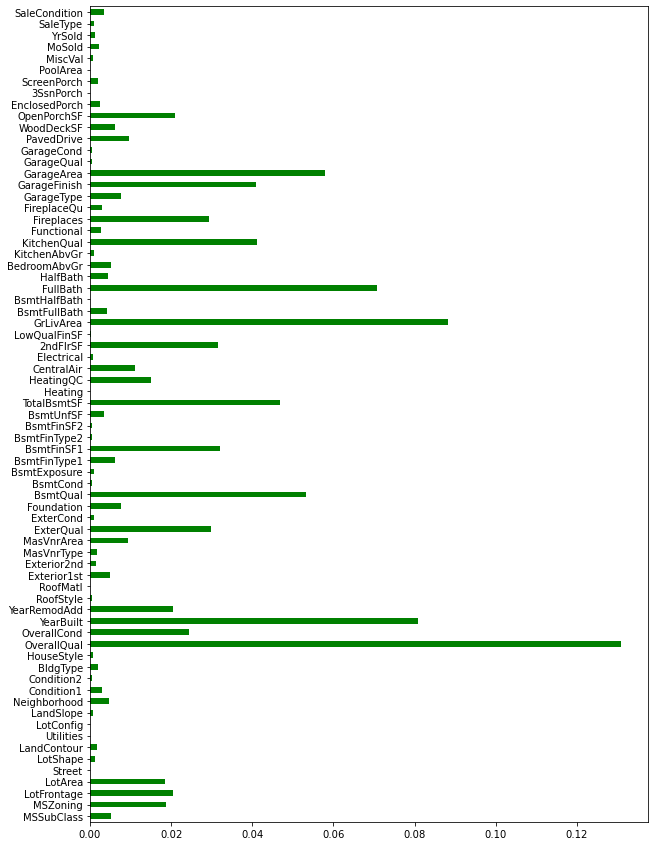

In [89]:
plt.figure(figsize=(10,15))
series=pd.Series(gr_model.feature_importances_,index=X.columns)
print(series.sort_values(ascending =False))
series.plot(kind='barh',color='Green')

* Overall quality of the houses have huge impact on sale price followed by GrLivArea ,YearBuilt,FullBath and Garage Area
* Some attributes like PoolArea,Utilities,Street,Heating have negligible impact on sale price

##### Saving the obj file

In [67]:
from sklearn.externals import joblib
joblib.dump(gr_model,'House_price_predictor_model.obj')

['House_price_predictor_model.obj']

## Loading test file

In [554]:
Test_data=pd.read_csv(r'C:\Users\guptaek\fliprobo_files\Project-Housing_splitted\test.csv')

In [555]:
Test_data.shape

(292, 80)

#### Doing all preprocessig steps same as training data

In [556]:
Test_data.drop(['MiscFeature','Fence','PoolQC','Alley','GarageCars','1stFlrSF','GarageYrBlt','TotRmsAbvGrd'],axis=1,inplace=True)

In [557]:
for i in Test_data.columns:
    if(Test_data.dtypes[i]=='int64'): Test_data[i]=Test_data[i].astype('int32')
    if(Test_data.dtypes[i]=='float64'): Test_data[i]=Test_data[i].astype('float32')

In [558]:
Test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 72 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int32  
 1   MSSubClass     292 non-null    int32  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float32
 4   LotArea        292 non-null    int32  
 5   Street         292 non-null    object 
 6   LotShape       292 non-null    object 
 7   LandContour    292 non-null    object 
 8   Utilities      292 non-null    object 
 9   LotConfig      292 non-null    object 
 10  LandSlope      292 non-null    object 
 11  Neighborhood   292 non-null    object 
 12  Condition1     292 non-null    object 
 13  Condition2     292 non-null    object 
 14  BldgType       292 non-null    object 
 15  HouseStyle     292 non-null    object 
 16  OverallQual    292 non-null    int32  
 17  OverallCond    292 non-null    int32  
 18  YearBuilt 

###### Dealing with Nan values

In [559]:
df_nan_=pd.DataFrame(Test_data[Test_data.columns[Test_data.isna().any()]].isna().sum())
df_nan_.columns=['null_values']
df_nan_['% of null values']=df_nan_['null_values']/2.92
df_nan_

,null_values,% of null values
LotFrontage,45,15.410959
MasVnrType,1,0.342466
MasVnrArea,1,0.342466
BsmtQual,7,2.397260
BsmtCond,7,2.397260
BsmtExposure,7,2.397260
BsmtFinType1,7,2.397260
BsmtFinType2,7,2.397260
Electrical,1,0.342466
FireplaceQu,139,47.602740


In [560]:
################################ Dealing with Null values the same way as training data ####################################
## repalacing Lot frontage area with the mean area (floored value)
Test_data['LotFrontage'].replace(np.nan,math.floor(Test_data['LotFrontage'].mean()),inplace=True)

### Masonry veneer type has only 7 nan values hence repalcing them by the most occuring value
Test_data['MasVnrType'].replace(np.nan,Test_data['MasVnrType'].mode()[0],inplace=True)

### Masonry veneer type also have 7 nan values so dealing the same was as masonry veneer type
Test_data['MasVnrArea'].replace(np.nan,Test_data['MasVnrArea'].mode()[0],inplace=True)

## basement quality and basement condition is categorical hence replacing with most occuring value which is 'TA'
Test_data['BsmtQual'].replace(np.nan,Test_data['BsmtQual'].mode()[0],inplace=True)
Test_data['BsmtCond'].replace(np.nan,Test_data['BsmtCond'].mode()[0],inplace=True)

## basement exposure  is categorical and more than 50% of houses No basement hence replacing BsmtExposure with the mode
Test_data['BsmtExposure'].replace(np.nan,Test_data['BsmtExposure'].mode()[0],inplace=True)

## Rating of basement finished area 1 and 2 is also categoricaland 2% values are nan  hence replacing BsmtFinType1 with the mode
Test_data['BsmtFinType1'].replace(np.nan,Test_data['BsmtFinType1'].mode()[0],inplace=True)
Test_data['BsmtFinType2'].replace(np.nan,Test_data['BsmtFinType2'].mode()[0],inplace=True)

## Fira place quality (FireplaceQu) is also categotrical and 47 % values are nan. replacing with Average quality (TA) for all nan's
Test_data['FireplaceQu'].replace(np.nan,'TA',inplace=True)

## Replacing Garage info columns with their respective modes
Test_data['GarageType'].replace(np.nan,Test_data['GarageType'].mode()[0],inplace=True)
Test_data['GarageFinish'].replace(np.nan,Test_data['GarageFinish'].mode()[0],inplace=True)
Test_data['GarageQual'].replace(np.nan,Test_data['GarageQual'].mode()[0],inplace=True)
Test_data['GarageCond'].replace(np.nan,Test_data['GarageCond'].mode()[0],inplace=True)

## Replacing electrical with mode
Test_data['Electrical'].replace(np.nan,Test_data['Electrical'].mode()[0],inplace=True)

In [561]:
df_nan_=pd.DataFrame(Test_data[Test_data.columns[Test_data.isna().any()]].isna().sum())
df_nan_.columns=['null_values']
df_nan_['% of null values']=df_nan_['null_values']/2.92
df_nan_

,null_values,% of null values


* Test data free from null values

In [562]:
Test_data['Utilities'].replace('NoSeWa','AllPub',inplace=True)
Test_data['Exterior1st'].replace('CBlock',Test_data['Exterior1st'].mode()[0],inplace=True)
Test_data['Exterior2nd'].replace('CBlock',Test_data['Exterior2nd'].mode()[0],inplace=True)

##### Label encoding String attributes 

In [563]:
#### using the list_encoder list which contains label encoder objects for each respective string attribute
for i in list_encoder:
    Test_data[i[1]]=i[0].transform(Test_data[i[1]])

In [564]:
##### using the same power transformer list so that test data can be transformed the same way
for i in pt:
    Test_data[i[1]]=i[0].transform(Test_data[i[1]].values.reshape(-1,1))

In [565]:
##### using the same scaling featues list so that test data can be transformed the same way
for i in ss:
    Test_data[i[1]]=i[0].transform(Test_data[i[1]].values.reshape(-1,1))

In [566]:
Test_data.drop(['Id'],axis=1,inplace=True)

In [567]:
Test_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-1.156799,-0.172372,0.924623,1.270449,0.045907,-1.420935,-3.210916,0.000000,-1.781874,-0.206793,...,0.819899,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,0.230877,-0.597913,0.392404,0.018491
1,1.362035,-0.172372,-0.153962,-0.952401,0.045907,-1.420935,0.313267,0.000000,-1.569524,-0.206793,...,-1.042808,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,0.604285,0.910351,-2.855499,-2.657431
2,-1.156799,-0.172372,-0.153962,0.720516,0.045907,0.718452,0.313267,0.000000,0.593303,-0.206793,...,1.312453,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,-0.142531,0.910351,0.392404,0.018491
3,0.708215,-0.172372,0.331401,0.760198,0.045907,0.718452,-3.211786,0.000000,0.593303,-0.206793,...,-1.042808,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,0.230877,0.910351,0.392404,0.018491
4,0.505548,-0.172372,0.924623,1.371004,0.045907,-1.420935,0.313267,0.000000,-1.569524,-0.206793,...,0.352534,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,-2.009573,0.156219,0.392404,0.018491


In [568]:
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1.362035,-0.172372,0.061755,-1.246882,0.045907,-1.420935,0.313267,0.000000,0.593303,-0.206793,...,1.451047,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,-1.636165,-0.597913,0.392404,0.018491
2,0.505548,-0.172372,1.248198,0.233684,0.045907,-1.420935,0.313267,0.000000,-1.569524,-0.206793,...,1.244506,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,-0.142531,-0.597913,0.392404,0.018491
3,-1.156799,-0.172372,1.949279,0.699119,0.045907,-1.420935,0.313267,0.000000,0.593303,-0.206793,...,1.215678,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,-2.009573,1.664482,-2.855499,0.018491
4,-1.156799,-0.172372,0.061755,1.821190,0.045907,-1.420935,0.313267,0.000000,-1.131063,-0.206793,...,-1.042808,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,-0.142531,0.910351,0.392404,0.018491
5,0.505548,-0.172372,-0.585396,1.246791,0.045907,-1.420935,0.313267,0.000000,0.593303,-0.206793,...,0.327296,-0.404987,-0.097745,-0.275303,0.000000,-0.164310,1.724510,-1.352045,-2.374717,2.353537


* As can be seen Test data preprocessed successfully exactly the same way as train data

In [575]:
pd.set_option('display.float_format', lambda x: '%.6f' % x)
Test_df=Test_data
Test_df=Test_df.astype('float32')

In [576]:
Test_df[Test_df==np.inf]=np.nan
for i in Test_df.columns:
    Test_df[i].replace(np.nan,Test_df[i].mode()[0],inplace=True)

#### Using prepared model to predict

In [607]:
predicted_sale_price=gr_model.predict(Test_df)

#### Since we have taken natural log of the target value during trainig our model ,Hence taking antilog to obtain exact values of saleprice

In [608]:
predicted_sale_price=(np.exp(predicted_sale_price)).round(3)

In [609]:
predicted_sale_price

array([321664.668, 177734.235, 232775.96 , 179760.807, 206830.033,
        77848.638, 127111.121, 308349.511, 232950.6  , 170575.259,
        73516.269, 134647.436, 111122.16 , 175944.27 , 241268.29 ,
       121464.575, 111421.53 , 116550.661, 169694.857, 213291.203,
       132771.891, 135423.841, 147174.645,  78221.458,  95002.278,
       123004.93 , 173544.301, 140113.164, 177892.527,  85937.601,
       122796.907, 198225.196, 189192.02 , 171766.796, 108614.951,
       169577.103, 194098.243, 114453.298, 146998.723, 140338.824,
        96227.294, 299361.53 , 199083.596, 188197.703, 138694.314,
       136549.586, 120838.591,  84971.978, 214805.917, 333478.841,
       136572.276, 192294.477,  96322.984,  92661.289, 267474.512,
       119726.802, 146272.097, 184238.57 , 105289.793, 238436.909,
        91667.108, 178364.681, 120374.561, 139059.796, 201356.849,
        88831.818, 151713.617, 205264.381, 141422.253, 153530.57 ,
       261590.141, 151613.03 , 185232.057, 146714.035, 138626.

In [616]:
pd.DataFrame({'sale_price':predicted_sale_price}).to_csv('predicted_sale_price')